In [1]:
import re
import matplotlib.pyplot as plt
import mdtraj as md
import numpy as np
import seaborn as sns
from scipy.stats import gaussian_kde
from scipy.signal import argrelextrema
from scipy.ndimage import gaussian_filter
import pandas as pd

In [2]:
# Constants for the simulation

R = 1.987E-3  # kcal/(mol*K)
T = 1000  # temperature of the avg MD simulation in K, will be automatically updated via actuall simulation temperature

namd_log_file = "1000k_run.txt"
dcd_file_path = "hw1_yagizebil.dcd"
top_file_path = "cyclohexane.psf"

binno = 37 # number of bins for the histogram of the dihedral angle distribution



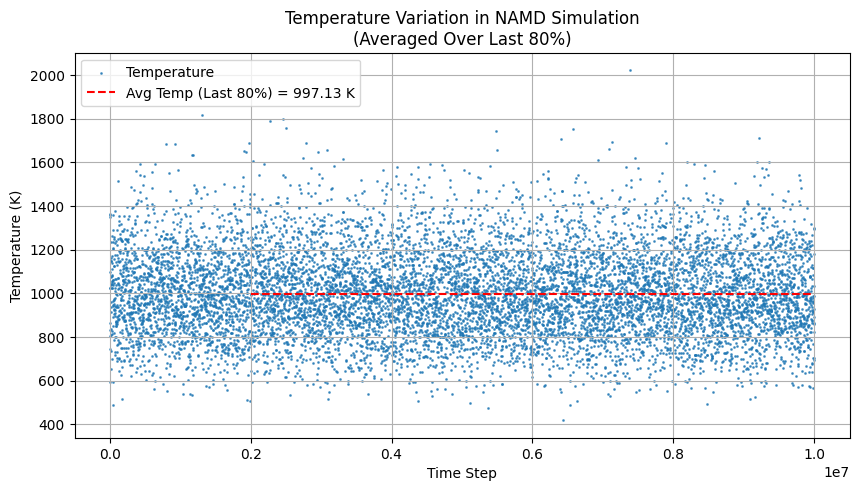


Average Temperature (Last 80% of Valid Trajectory): 997.13 K


In [3]:
# Define the percentage of the trajectory to average
percent_to_average = 80  # Change this to any percentage (e.g., 70, 50, etc.)

def extract_valid_temperatures(namd_log_file):
    """
    Extracts valid time and temperature data from a NAMD output log file.
    Skips minimization steps where temperature = 0.0000.
    """
    time_steps = []
    temperatures = []

    with open(namd_log_file, 'r') as file:
        for line in file:
            if line.startswith("ENERGY:"):
                columns = line.split()
                if len(columns) > 13:  # Ensure there are enough columns
                    time_step = int(columns[1])  # First column after "ENERGY"
                    temperature = float(columns[12])  # 12th column after "ENERGY"
                    
                    # Skip minimization steps where temperature is 0.0000
                    if temperature > 0.0:
                        time_steps.append(time_step)
                        temperatures.append(temperature)

    return time_steps, temperatures


def plot_temperature(time_steps, temperatures, avg_temp, last_x_time_steps, start_index):
    """
    Plots temperature vs. time with an average line for the last X% of the trajectory.
    """
    plt.figure(figsize=(10, 5))
    
    # Plot temperature trajectory
    plt.scatter(time_steps, temperatures, marker='o', s=1, alpha=0.7, label="Temperature")
    
    # Plot average temperature line only for the selected last X% of the trajectory
    if avg_temp is not None:
        plt.hlines(y=avg_temp, xmin=time_steps[start_index], xmax=time_steps[-1], 
                   colors='r', linestyles='--', label=f"Avg Temp (Last {percent_to_average}%) = {avg_temp:.2f} K")

    plt.xlabel("Time Step")
    plt.ylabel("Temperature (K)")
    plt.title(f"Temperature Variation in NAMD Simulation\n(Averaged Over Last {percent_to_average}%)")
    plt.grid(True)
    plt.legend()
    plt.savefig("temperature_vs_time.png")
    plt.show()

# Function to compute the average temperature over the last X% of the trajectory
def compute_avg_last_x_percent(time_steps, temperatures, percent_to_average):
    """
    Computes the average temperature over the last X% of the trajectory.
    """
    total_valid_points = len(temperatures)
    if total_valid_points == 0:
        return None, None, None, 0

    # Calculate the starting index for the last X% of the trajectory
    start_index = int((1 - percent_to_average / 100) * total_valid_points)
    last_x_time_steps = time_steps[start_index:]
    avg_temp = np.mean(temperatures[start_index:])

    return avg_temp, last_x_time_steps, start_index, total_valid_points

# Example Usage

time_steps, temperatures = extract_valid_temperatures(namd_log_file)

# Compute average temperature in the last X% of the trajectory
average_temperature, last_x_time_steps, start_index, total_valid_points = compute_avg_last_x_percent(time_steps, temperatures, percent_to_average)

# Plot temperature vs. time with the average temperature line
plot_temperature(time_steps, temperatures, average_temperature, last_x_time_steps, start_index)

# Print the average temperature value
if average_temperature is not None:
    print(f"\nAverage Temperature (Last {percent_to_average}% of Valid Trajectory): {average_temperature:.2f} K")
    T = average_temperature
else:
    print("\nNo temperature data found.")


In [4]:
# Function to compute dihedral angles (trans as 0 degrees)
def compute_dihedral(p0, p1, p2, p3):
    b0 = p1 - p0
    b1 = p2 - p1
    b2 = p3 - p2
    
    b1 /= np.linalg.norm(b1)  # Normalize b1
    
    v = b0 - np.dot(b0, b1) * b1
    w = b2 - np.dot(b2, b1) * b1
    
    x = np.dot(v, w)
    y = np.dot(np.cross(b1, v), w)
    
    return np.degrees(np.arctan2(y, x))

# Load the trajectory and topology
traj = md.load_dcd(dcd_file_path, top_file_path, stride=1)

# Identify carbon atoms
carbon_atoms = [atom.index for atom in traj.topology.atoms if atom.element.symbol == 'C']

# For cyclohexane with 6 carbon atoms, create 6 dihedral quadruplets
# Each dihedral is defined by 4 consecutive carbon atoms, wrapping around as needed
quadruplets = []
for i in range(len(carbon_atoms)):
    # Create quadruplet with wrapping (for cyclohexane, carbon atoms in a ring)
    q = [carbon_atoms[i % len(carbon_atoms)], 
         carbon_atoms[(i + 1) % len(carbon_atoms)], 
         carbon_atoms[(i + 2) % len(carbon_atoms)], 
         carbon_atoms[(i + 3) % len(carbon_atoms)]]
    quadruplets.append(q)

print (quadruplets)


[[0, 3, 6, 9], [3, 6, 9, 12], [6, 9, 12, 15], [9, 12, 15, 0], [12, 15, 0, 3], [15, 0, 3, 6]]


Dihedral Angle 1 Region Probabilities:
  Region 1: 0.493
  Region 2: 0.000
  Region 3: 0.507
Dihedral Angle 2 Region Probabilities:
  Region 1: 0.500
  Region 2: 0.000
  Region 3: 0.500
Dihedral Angle 3 Region Probabilities:
  Region 1: 0.503
  Region 2: 0.000
  Region 3: 0.497
Dihedral Angle 4 Region Probabilities:
  Region 1: 0.500
  Region 2: 0.000
  Region 3: 0.500
Dihedral Angle 5 Region Probabilities:
  Region 1: 0.495
  Region 2: 0.000
  Region 3: 0.505
Dihedral Angle 6 Region Probabilities:
  Region 1: 0.509
  Region 2: 0.000
  Region 3: 0.491


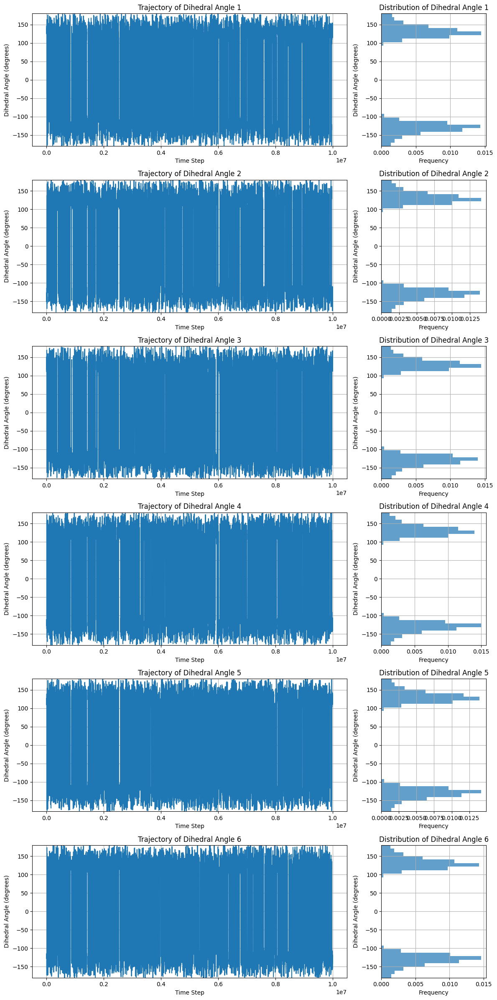

In [5]:
# Ensure `traj` and `quadruplets` are defined before this cell
if 'traj' not in locals() or 'quadruplets' not in locals():
    raise ValueError("The variables `traj` and `quadruplets` must be defined before running this cell.")

# Compute dihedral angles
dihedral_angles = []
for frame in traj.xyz:
    angles = [compute_dihedral(frame[q[0]], frame[q[1]], frame[q[2]], frame[q[3]]) for q in quadruplets]
    dihedral_angles.append(angles)

dihedral_angles = np.array(dihedral_angles)

# Ensure `time_steps` is defined before this cell
if 'time_steps' not in locals():
    time_steps = np.arange(dihedral_angles.shape[0])

# Plot each dihedral angle trajectory with histogram
num_angles = dihedral_angles.shape[1]  # Should be 6 for cyclohexane

fig, axes = plt.subplots(num_angles, 2, figsize=(12, 4 * num_angles), gridspec_kw={'width_ratios': [3, 1]})

for i in range(num_angles):
    # Left: Dihedral trajectory
    axes[i, 0].plot(time_steps, dihedral_angles[:, i])
    axes[i, 0].set_xlabel('Time Step')
    axes[i, 0].set_ylabel('Dihedral Angle (degrees)')
    axes[i, 0].set_title(f'Trajectory of Dihedral Angle {i+1}')
    axes[i, 0].set_ylim(-180, 180)
    axes[i, 0].grid(True)
    
    # Right: Histogram tipped over and aligned to the right
    counts, bin_edges, _ = axes[i, 1].hist(dihedral_angles[:, i], bins=binno, density=True, orientation='horizontal', alpha=0.7)
    axes[i, 1].set_xlabel('Frequency')
    axes[i, 1].set_ylabel('Dihedral Angle (degrees)')
    axes[i, 1].set_title(f'Distribution of Dihedral Angle {i+1}')
    axes[i, 1].set_ylim(-180, 180)
    axes[i, 1].grid(True)

    # Calculate probabilities for 3 regions: [-180, -60], [-60, 60], [60, 180]
    region_edges = [-180, -60, 60, 180]
    region_probabilities = []
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2  # Convert bin edges to centers

    for j in range(len(region_edges) - 1):
        # Find indices of bins within the current region
        region_mask = (bin_centers >= region_edges[j]) & (bin_centers < region_edges[j + 1])
        probability = np.sum(counts[region_mask]) * (bin_edges[1] - bin_edges[0])  # Probability mass
        region_probabilities.append((f'Region {j+1}', probability))

    # Report probabilities
    print(f"Dihedral Angle {i+1} Region Probabilities:")
    for region, prob in region_probabilities:
        print(f"  {region}: {prob:.3f}")

plt.tight_layout()
plt.savefig("dihedral_trajectories_histograms.png")
plt.show()


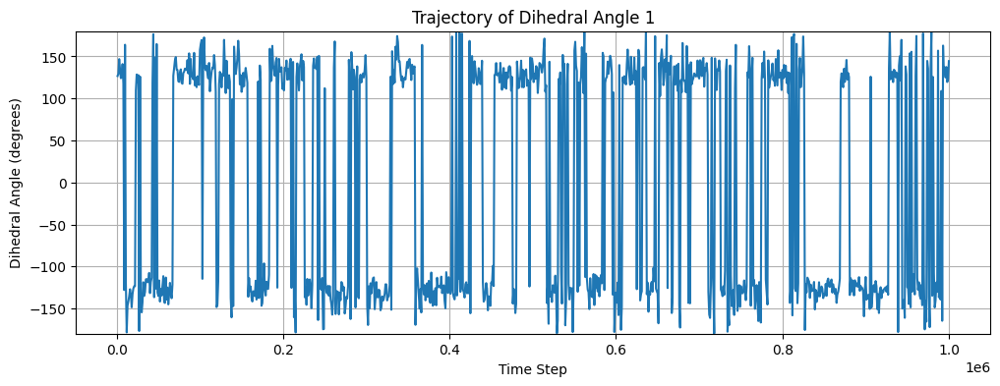

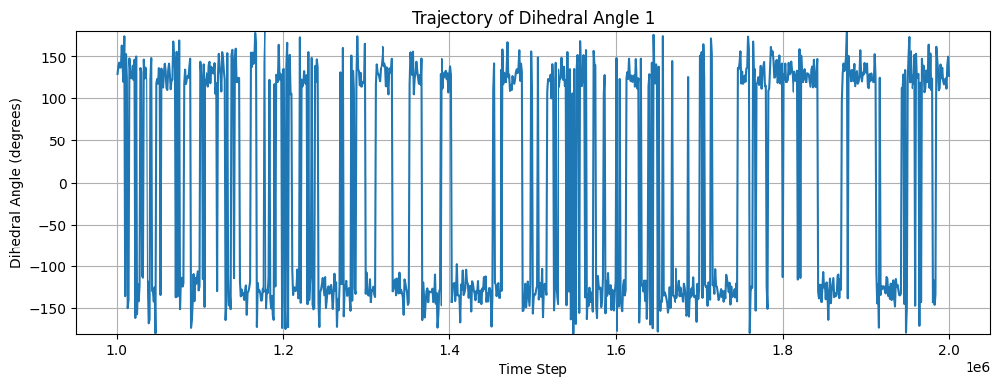

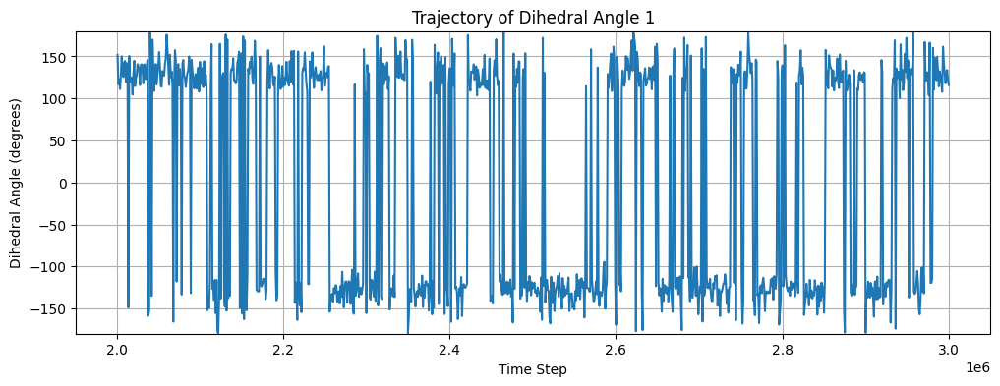

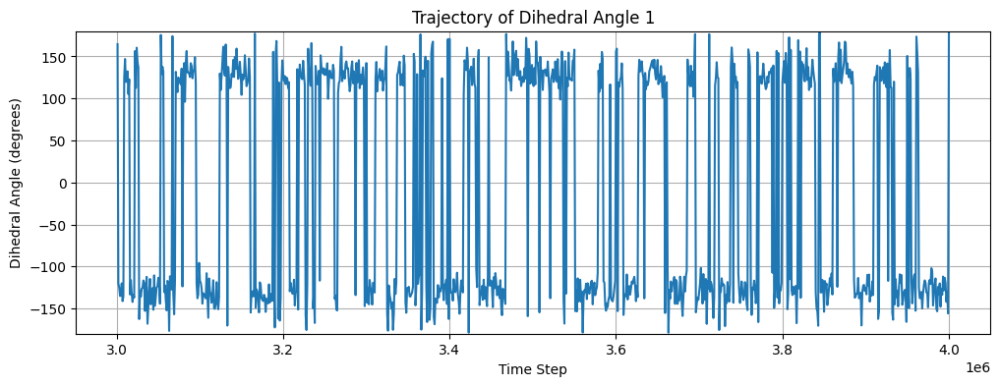

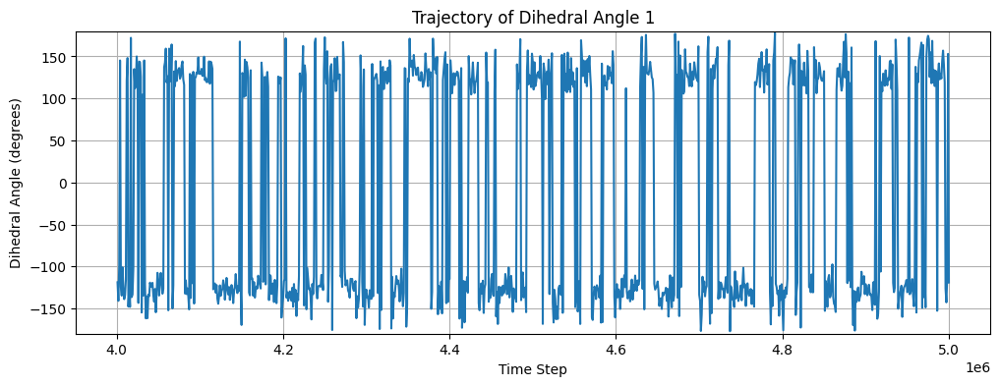

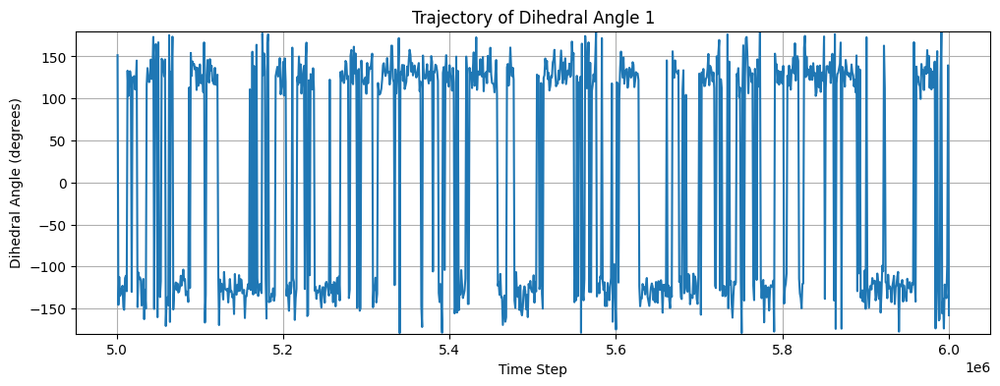

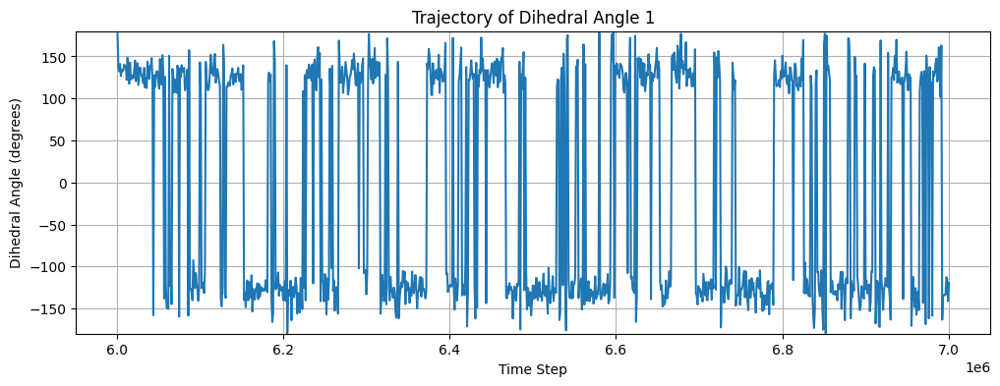

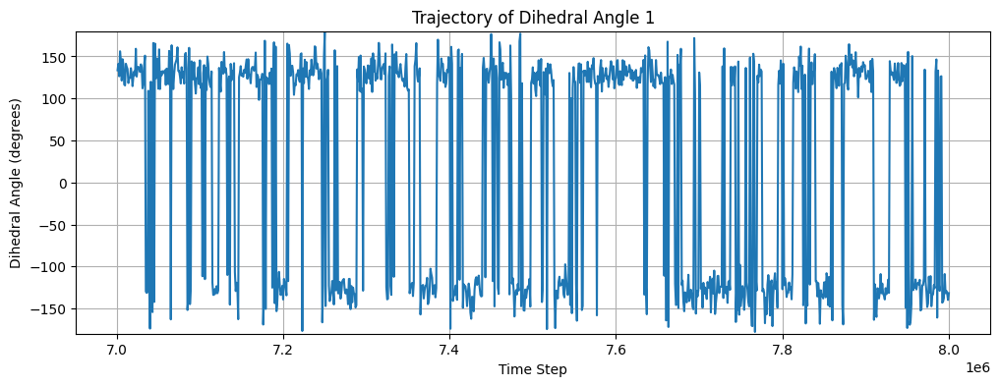

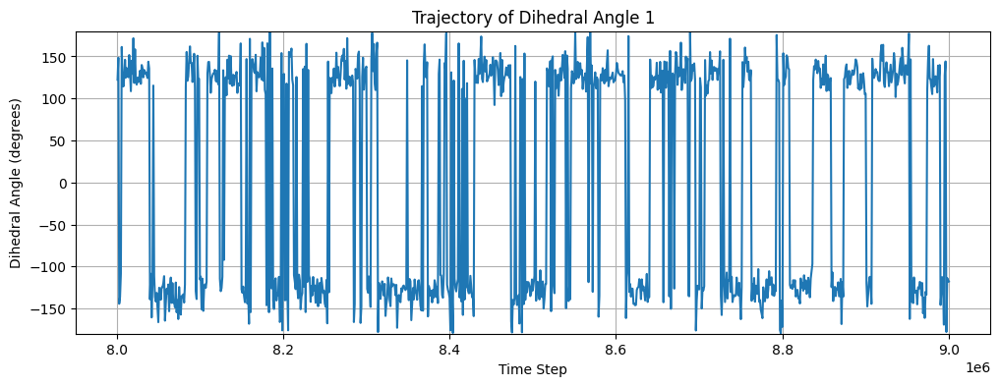

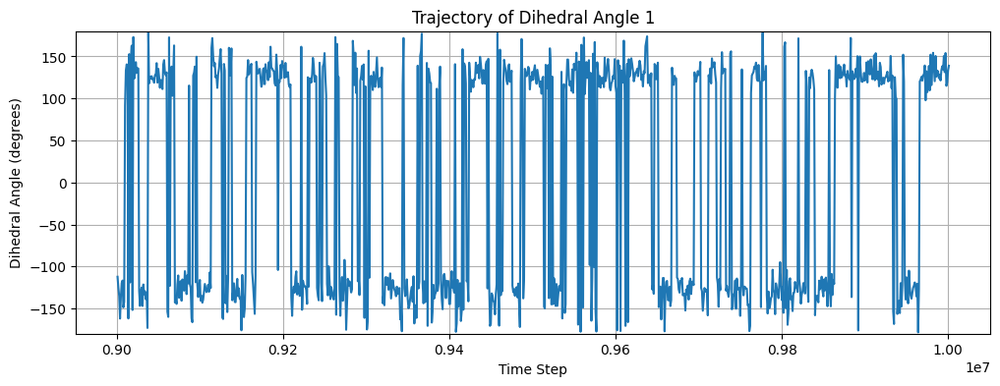

In [6]:
# Replot the first dihedral into 10 trajectorie plots, where each plot is 10% of the trajectory

for i in range(10):
    fig, ax = plt.subplots(1, 1, figsize=(12, 4))
    start = int(i * 0.1 * len(dihedral_angles))
    end = int((i + 1) * 0.1 * len(dihedral_angles))
    ax.plot(time_steps[start:end], dihedral_angles[start:end, 0])
    ax.set_xlabel('Time Step')
    ax.set_ylabel('Dihedral Angle (degrees)')
    ax.set_title(f'Trajectory of Dihedral Angle 1')
    ax.set_ylim(-180, 180)
    ax.grid(True)
    plt.savefig(f"dihedral_angle_1_trajectory_{i+1}.png")
    plt.show()

/var/folders/sg/h36wrbcn279ftl805y_d67tc0000gn/T/ipykernel_15107/1876391909.py:18: RuntimeWarning: divide by zero encountered in log
  transformed_n = -R * T * np.log(n)


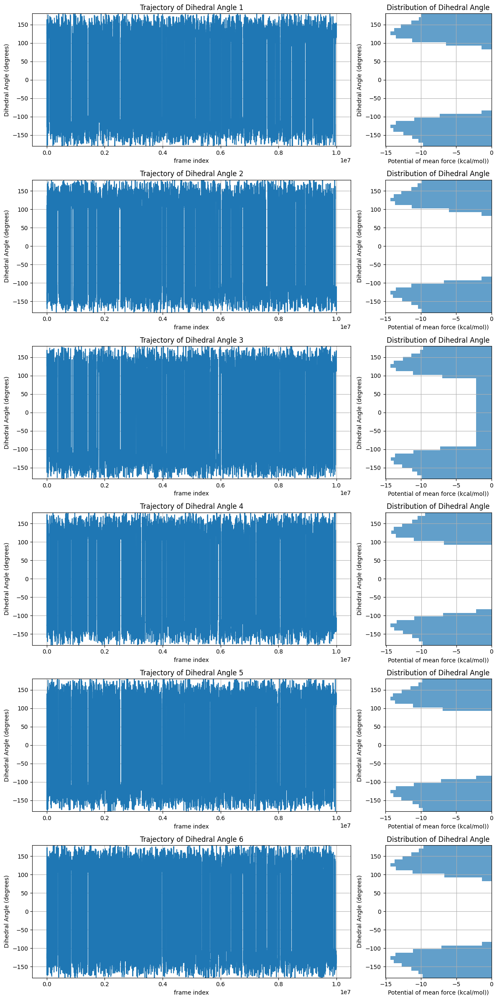

In [7]:
fig, axes = plt.subplots(num_angles, 2, figsize=(12, 4 * num_angles), gridspec_kw={'width_ratios': [3, 1]})

for i in range(num_angles):
    # Left: Dihedral trajectory
    axes[i, 0].plot(time_steps, dihedral_angles[:, i])
    axes[i, 0].set_xlabel('frame index')
    axes[i, 0].set_ylabel('Dihedral Angle (degrees)')
    axes[i, 0].set_title(f'Trajectory of Dihedral Angle {i+1}')
    axes[i, 0].set_ylim(-180, 180)
    axes[i, 0].grid(True)
    
    # Right: potential of mean force 
    n, bins = np.histogram(dihedral_angles[:, i], bins=binno)  # Get histogram counts
    bin_centers = (bins[:-1] + bins[1:]) / 2  # Convert bin edges to centers

    # Avoid log(0) by replacing zeros with a small positive value
    n[n == 0] = np.min(n[n > 0]) / 10  
    transformed_n = -R * T * np.log(n)

    axes[i, 1].barh(bin_centers, transformed_n, height=np.diff(bins), alpha=0.7)
    axes[i, 1].set_xlabel('Potential of mean force (kcal/mol))')
    axes[i, 1].set_ylabel('Dihedral Angle (degrees)')
    axes[i, 1].set_title('Distribution of Dihedral Angle')
    axes[i, 1].set_ylim(-180, 180)
    axes[i, 1].grid(True)

plt.tight_layout()
plt.savefig("pmf_plots.png")
plt.show()

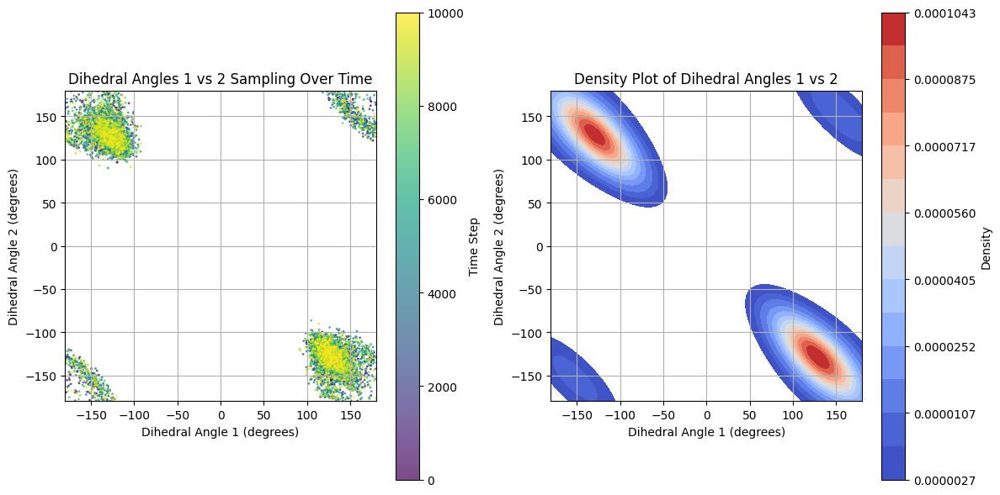

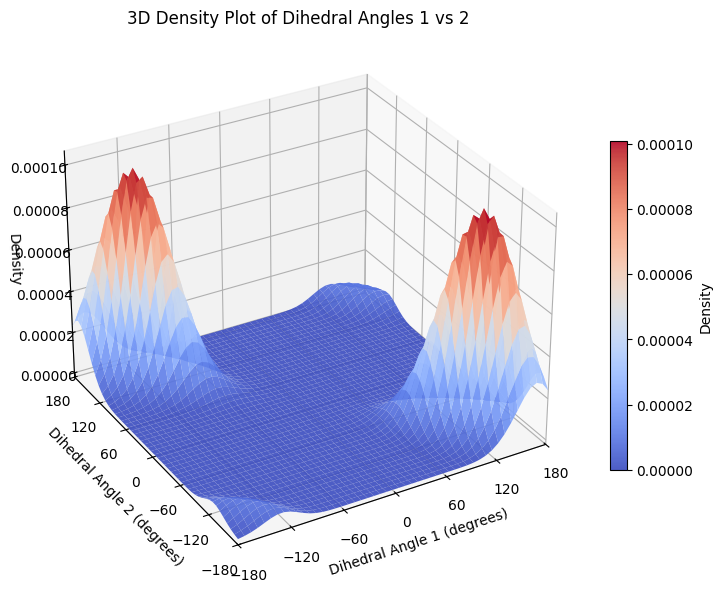

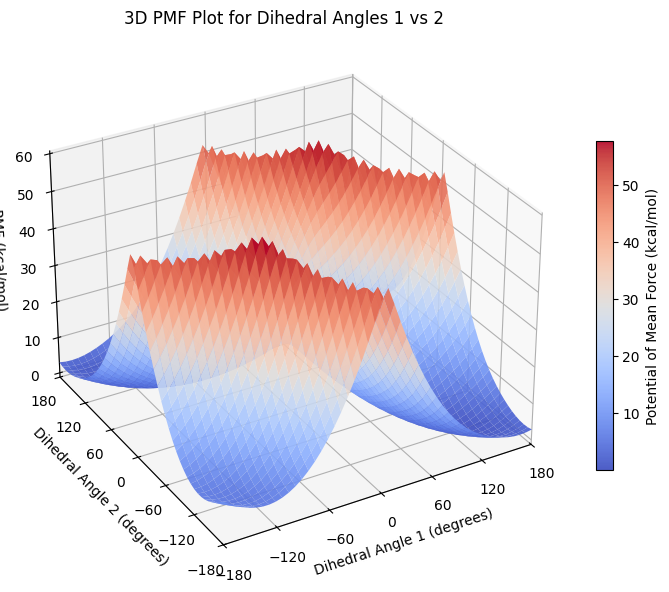

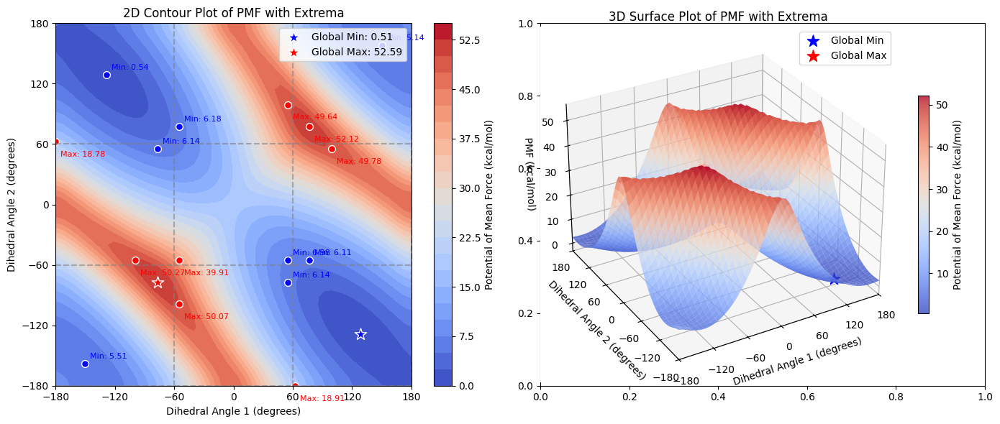


Global Extrema for Dihedral Angles 1 vs 2
Global Minimum: 0.51 kcal/mol at (128.6, -128.6) degrees
Global Maximum: 52.59 kcal/mol at (-77.1, -77.1) degrees
Energy Range: 52.08 kcal/mol

Local Minima for Dihedral Angles 1 vs 2
Region         Center         Minimum Location         Energy (kcal/mol)   
----------------------------------------------------------------------------------------------------
Region(2, 0)   (  120,  -120)   ( 128.6, -128.6)         0.51
Region(0, 2)   ( -120,   120)   (-128.6,  128.6)         0.54
Region(2, 2)   (  120,   120)   ( 150.6,  158.0)         5.14
Region(0, 0)   ( -120,  -120)   (-150.6, -158.0)         5.51
Region(2, 1)   (  120,     0)   (  77.1,  -55.1)         6.11
Region(0, 1)   ( -120,     0)   ( -77.1,   55.1)         6.14
Region(1, 0)   (    0,  -120)   (  55.1,  -77.1)         6.14
Region(1, 2)   (    0,   120)   ( -55.1,   77.1)         6.18
Region(1, 1)   (    0,     0)   (  55.1,  -55.1)         6.98

Local Maxima for Dihedral Angles 1 vs

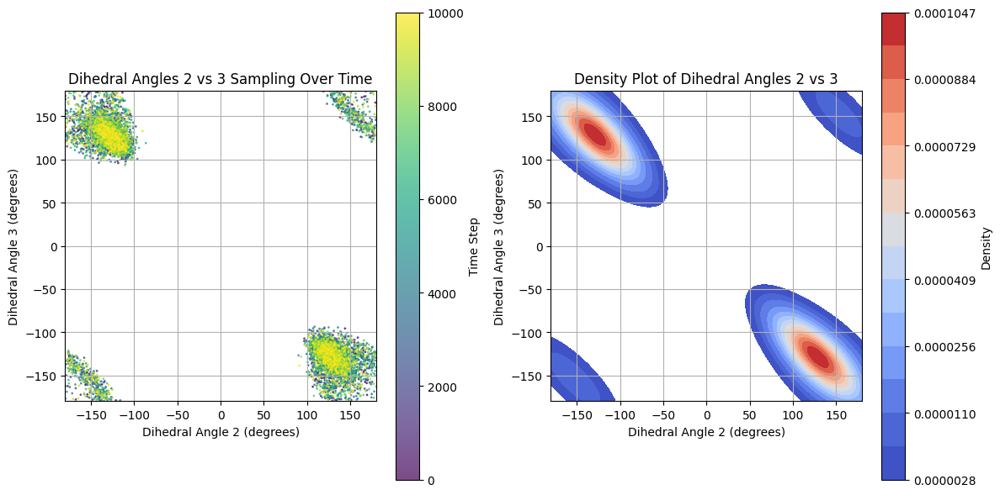

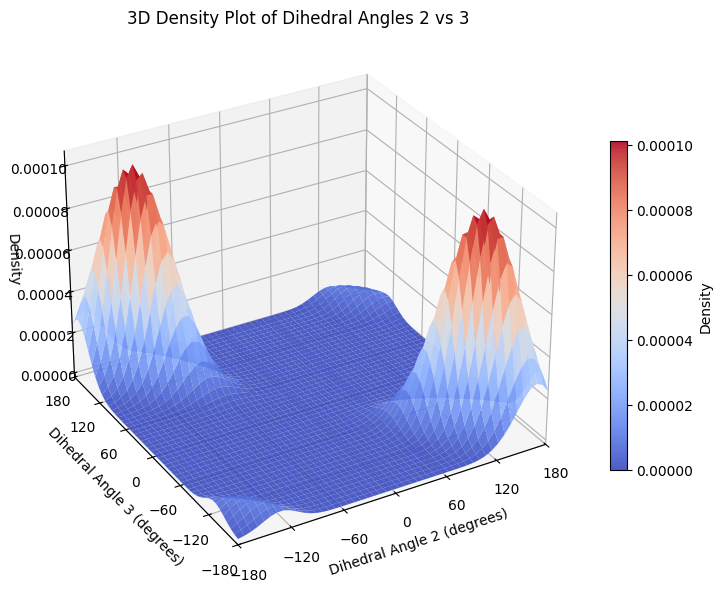

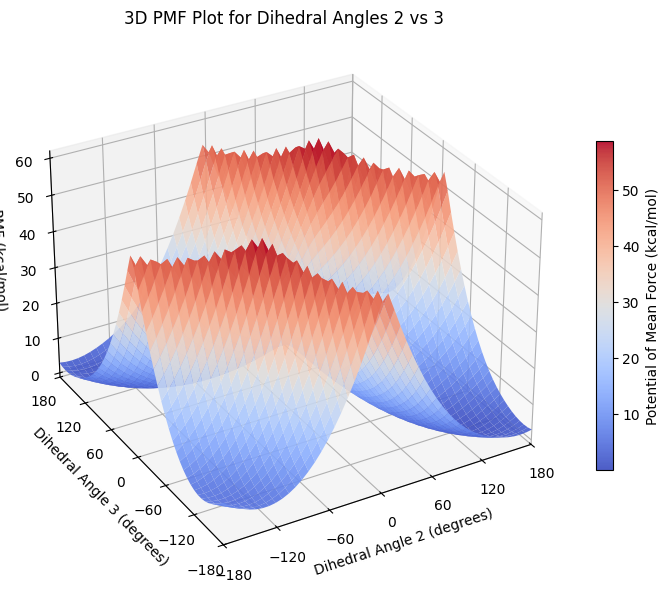

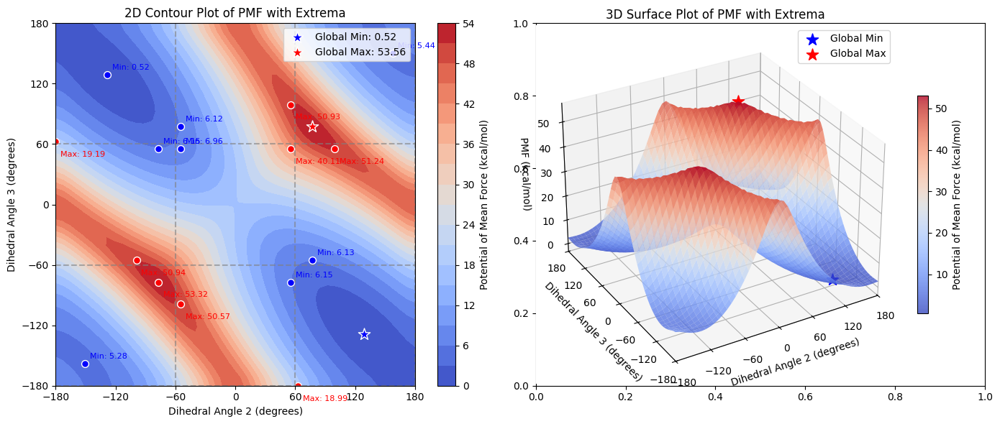


Global Extrema for Dihedral Angles 2 vs 3
Global Minimum: 0.52 kcal/mol at (128.6, -128.6) degrees
Global Maximum: 53.56 kcal/mol at (77.1, 77.1) degrees
Energy Range: 53.04 kcal/mol

Local Minima for Dihedral Angles 2 vs 3
Region         Center         Minimum Location         Energy (kcal/mol)   
----------------------------------------------------------------------------------------------------
Region(2, 0)   (  120,  -120)   ( 128.6, -128.6)         0.52
Region(0, 2)   ( -120,   120)   (-128.6,  128.6)         0.52
Region(0, 0)   ( -120,  -120)   (-150.6, -158.0)         5.28
Region(2, 2)   (  120,   120)   ( 158.0,  150.6)         5.44
Region(1, 2)   (    0,   120)   ( -55.1,   77.1)         6.12
Region(2, 1)   (  120,     0)   (  77.1,  -55.1)         6.13
Region(1, 0)   (    0,  -120)   (  55.1,  -77.1)         6.15
Region(0, 1)   ( -120,     0)   ( -77.1,   55.1)         6.15
Region(1, 1)   (    0,     0)   ( -55.1,   55.1)         6.96

Local Maxima for Dihedral Angles 2 vs 3

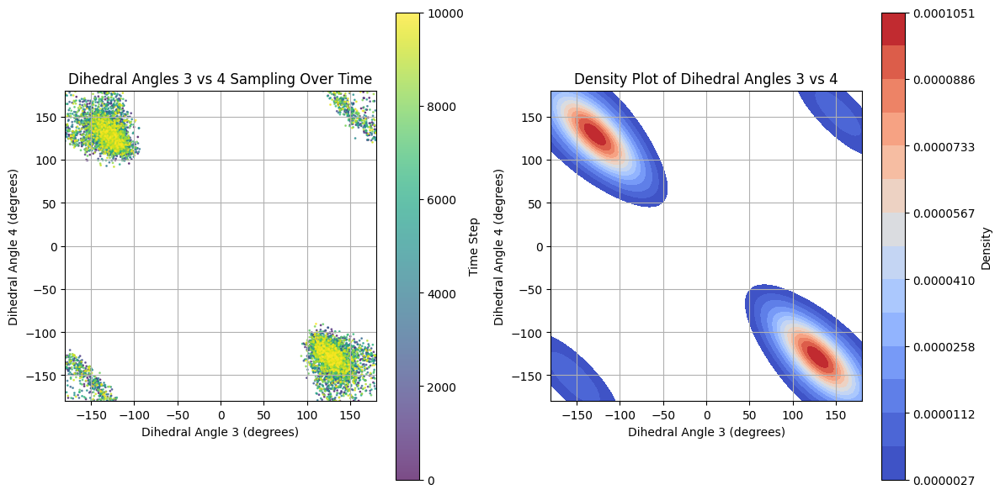

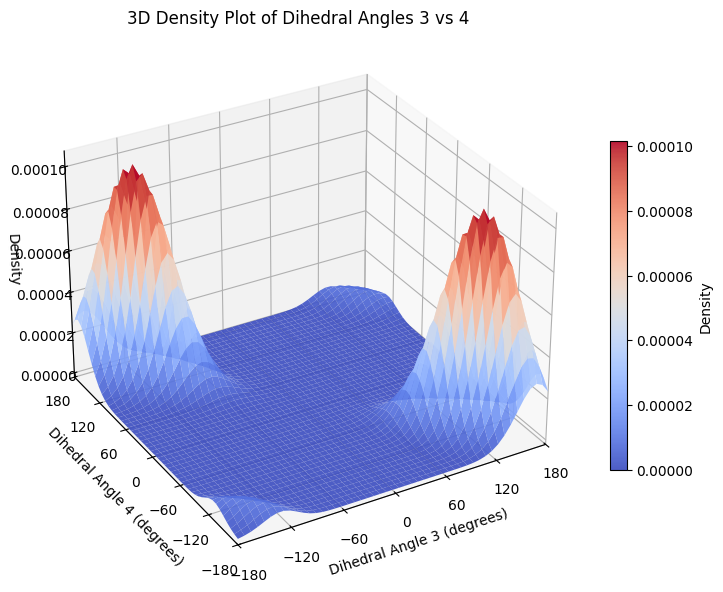

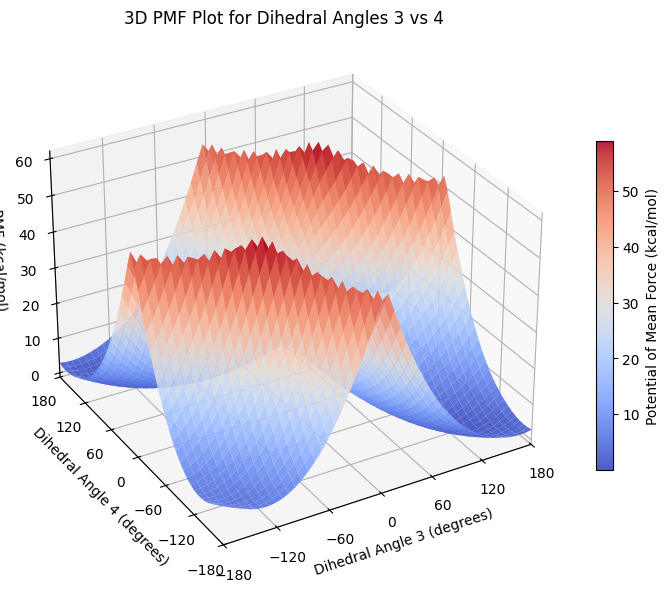

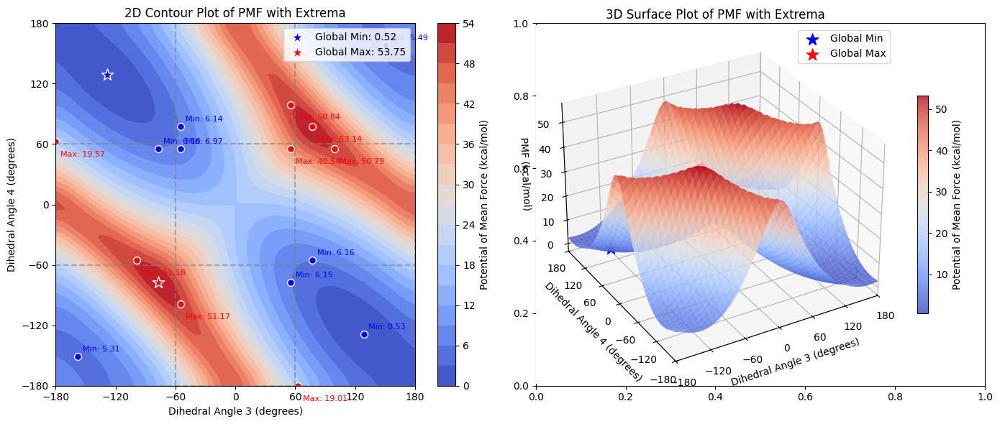


Global Extrema for Dihedral Angles 3 vs 4
Global Minimum: 0.52 kcal/mol at (-128.6, 128.6) degrees
Global Maximum: 53.75 kcal/mol at (-77.1, -77.1) degrees
Energy Range: 53.23 kcal/mol

Local Minima for Dihedral Angles 3 vs 4
Region         Center         Minimum Location         Energy (kcal/mol)   
----------------------------------------------------------------------------------------------------
Region(0, 2)   ( -120,   120)   (-128.6,  128.6)         0.52
Region(2, 0)   (  120,  -120)   ( 128.6, -128.6)         0.53
Region(0, 0)   ( -120,  -120)   (-158.0, -150.6)         5.31
Region(2, 2)   (  120,   120)   ( 150.6,  158.0)         5.49
Region(1, 2)   (    0,   120)   ( -55.1,   77.1)         6.14
Region(1, 0)   (    0,  -120)   (  55.1,  -77.1)         6.15
Region(2, 1)   (  120,     0)   (  77.1,  -55.1)         6.16
Region(0, 1)   ( -120,     0)   ( -77.1,   55.1)         6.18
Region(1, 1)   (    0,     0)   ( -55.1,   55.1)         6.97

Local Maxima for Dihedral Angles 3 vs

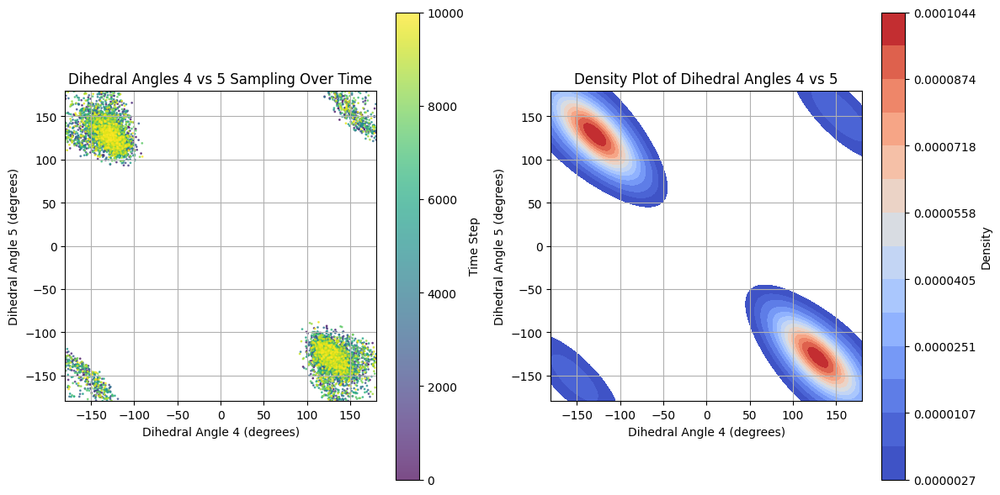

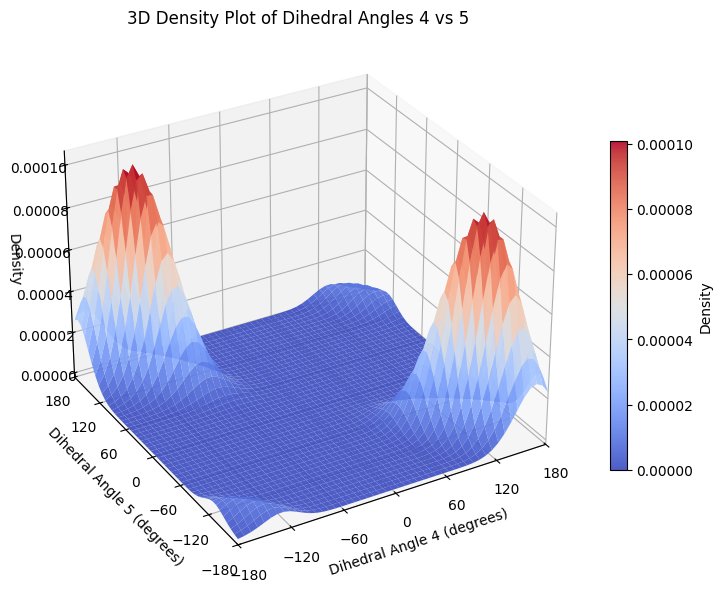

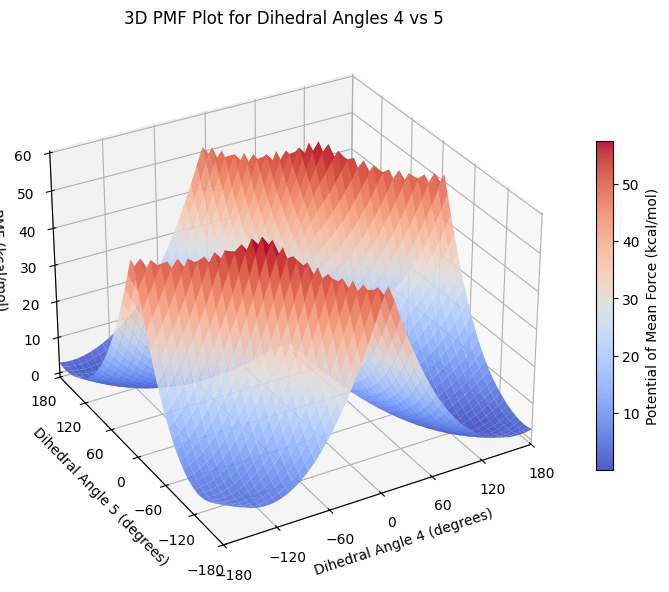

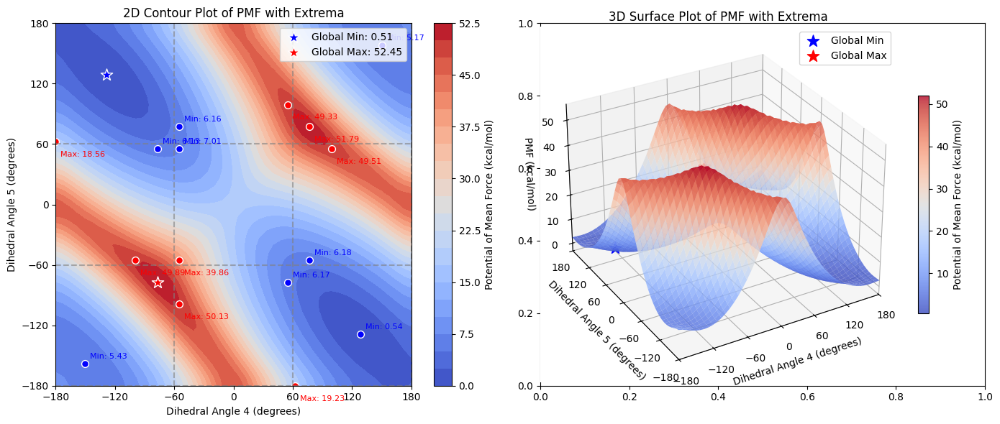


Global Extrema for Dihedral Angles 4 vs 5
Global Minimum: 0.51 kcal/mol at (-128.6, 128.6) degrees
Global Maximum: 52.45 kcal/mol at (-77.1, -77.1) degrees
Energy Range: 51.94 kcal/mol

Local Minima for Dihedral Angles 4 vs 5
Region         Center         Minimum Location         Energy (kcal/mol)   
----------------------------------------------------------------------------------------------------
Region(0, 2)   ( -120,   120)   (-128.6,  128.6)         0.51
Region(2, 0)   (  120,  -120)   ( 128.6, -128.6)         0.54
Region(2, 2)   (  120,   120)   ( 150.6,  158.0)         5.17
Region(0, 0)   ( -120,  -120)   (-150.6, -158.0)         5.43
Region(0, 1)   ( -120,     0)   ( -77.1,   55.1)         6.13
Region(1, 2)   (    0,   120)   ( -55.1,   77.1)         6.16
Region(1, 0)   (    0,  -120)   (  55.1,  -77.1)         6.17
Region(2, 1)   (  120,     0)   (  77.1,  -55.1)         6.18
Region(1, 1)   (    0,     0)   ( -55.1,   55.1)         7.01

Local Maxima for Dihedral Angles 4 vs

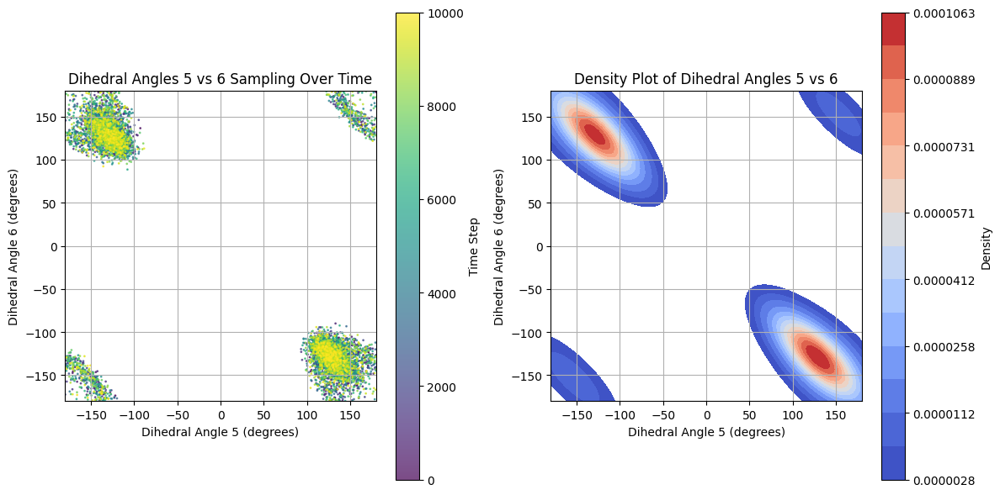

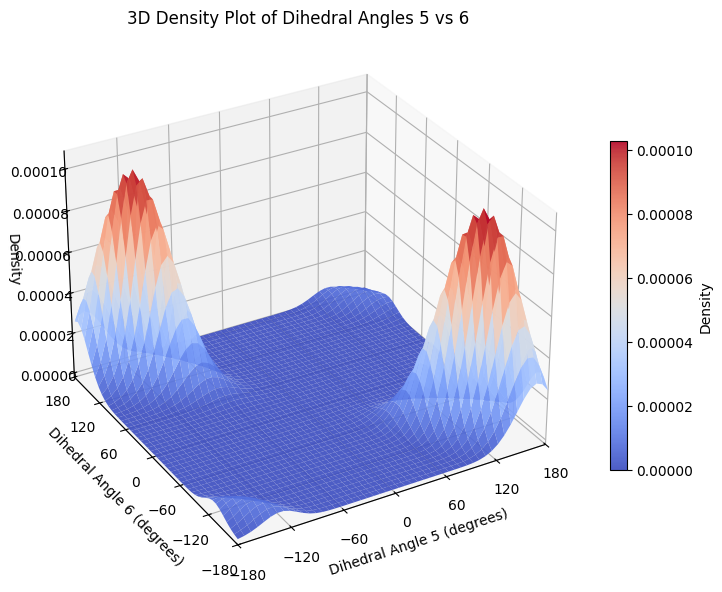

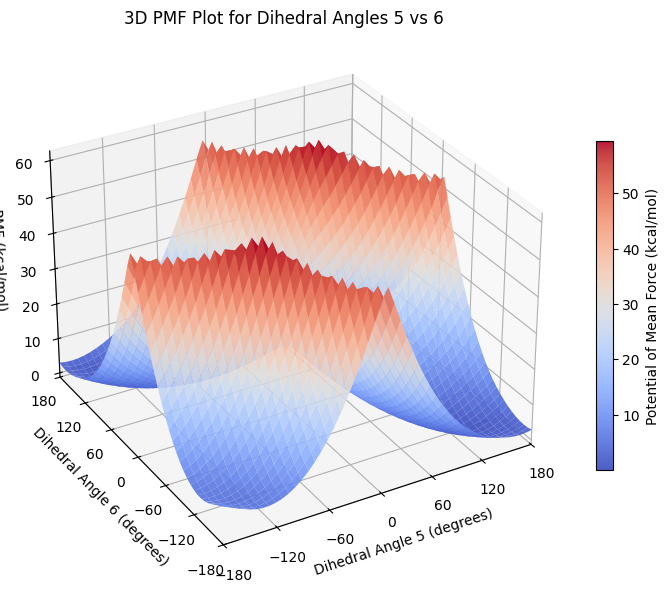

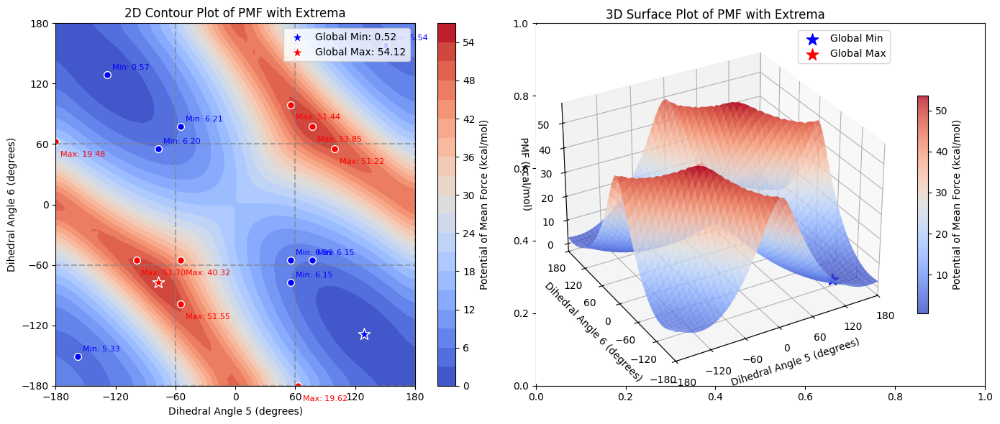


Global Extrema for Dihedral Angles 5 vs 6
Global Minimum: 0.52 kcal/mol at (128.6, -128.6) degrees
Global Maximum: 54.12 kcal/mol at (-77.1, -77.1) degrees
Energy Range: 53.60 kcal/mol

Local Minima for Dihedral Angles 5 vs 6
Region         Center         Minimum Location         Energy (kcal/mol)   
----------------------------------------------------------------------------------------------------
Region(2, 0)   (  120,  -120)   ( 128.6, -128.6)         0.52
Region(0, 2)   ( -120,   120)   (-128.6,  128.6)         0.57
Region(0, 0)   ( -120,  -120)   (-158.0, -150.6)         5.33
Region(2, 2)   (  120,   120)   ( 150.6,  158.0)         5.54
Region(2, 1)   (  120,     0)   (  77.1,  -55.1)         6.15
Region(1, 0)   (    0,  -120)   (  55.1,  -77.1)         6.15
Region(0, 1)   ( -120,     0)   ( -77.1,   55.1)         6.20
Region(1, 2)   (    0,   120)   ( -55.1,   77.1)         6.21
Region(1, 1)   (    0,     0)   (  55.1,  -55.1)         6.99

Local Maxima for Dihedral Angles 5 vs

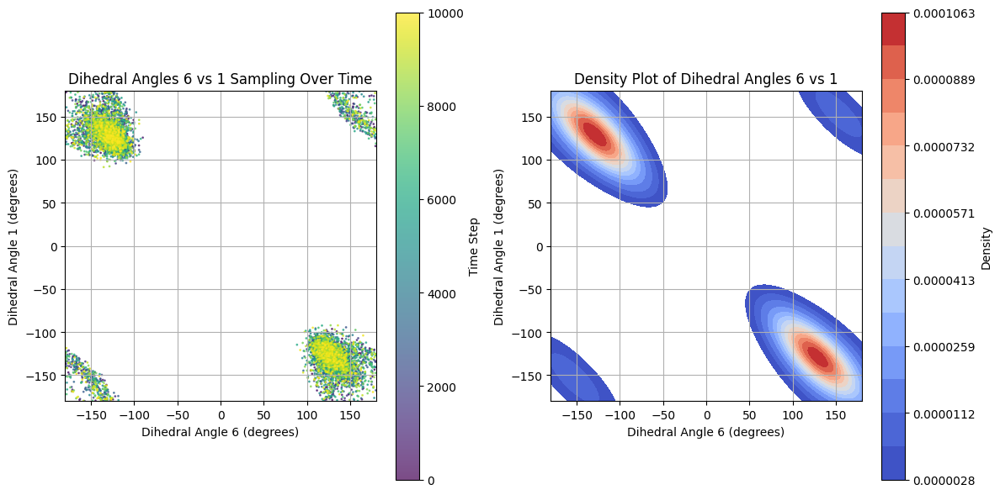

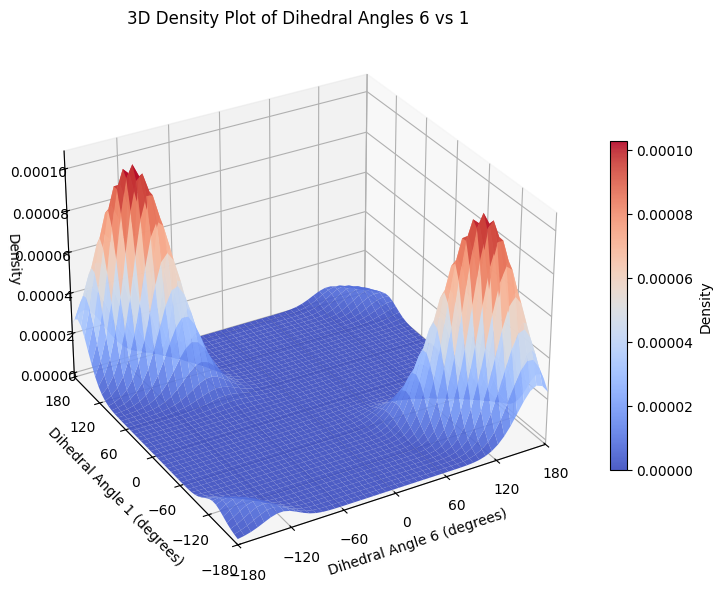

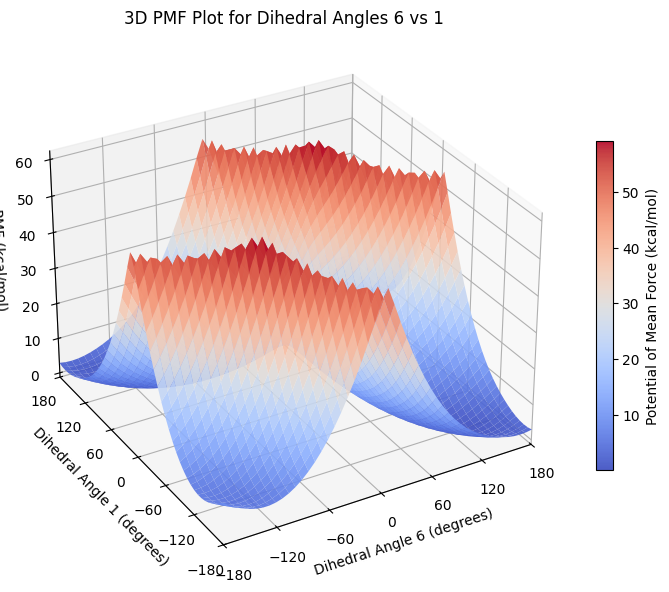

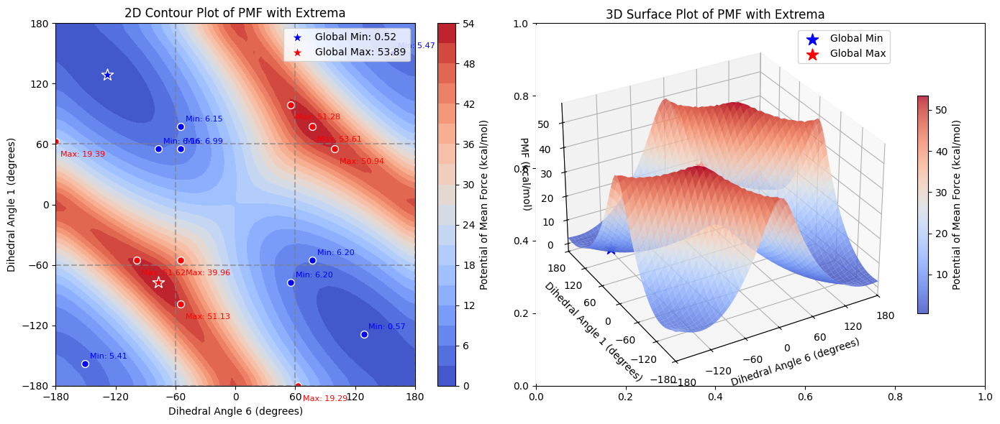


Global Extrema for Dihedral Angles 6 vs 1
Global Minimum: 0.52 kcal/mol at (-128.6, 128.6) degrees
Global Maximum: 53.89 kcal/mol at (-77.1, -77.1) degrees
Energy Range: 53.37 kcal/mol

Local Minima for Dihedral Angles 6 vs 1
Region         Center         Minimum Location         Energy (kcal/mol)   
----------------------------------------------------------------------------------------------------
Region(0, 2)   ( -120,   120)   (-128.6,  128.6)         0.52
Region(2, 0)   (  120,  -120)   ( 128.6, -128.6)         0.57
Region(0, 0)   ( -120,  -120)   (-150.6, -158.0)         5.41
Region(2, 2)   (  120,   120)   ( 158.0,  150.6)         5.47
Region(1, 2)   (    0,   120)   ( -55.1,   77.1)         6.15
Region(0, 1)   ( -120,     0)   ( -77.1,   55.1)         6.16
Region(2, 1)   (  120,     0)   (  77.1,  -55.1)         6.20
Region(1, 0)   (    0,  -120)   (  55.1,  -77.1)         6.20
Region(1, 1)   (    0,     0)   ( -55.1,   55.1)         6.99

Local Maxima for Dihedral Angles 6 vs

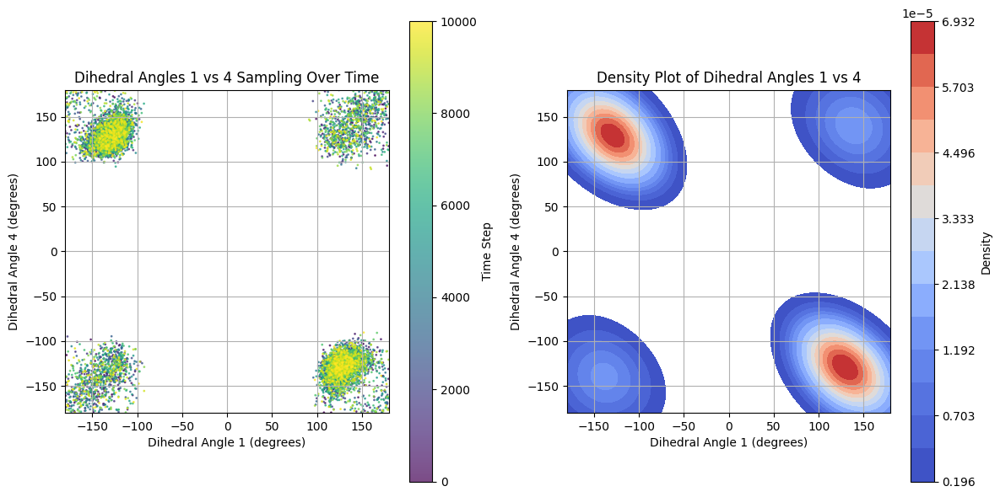

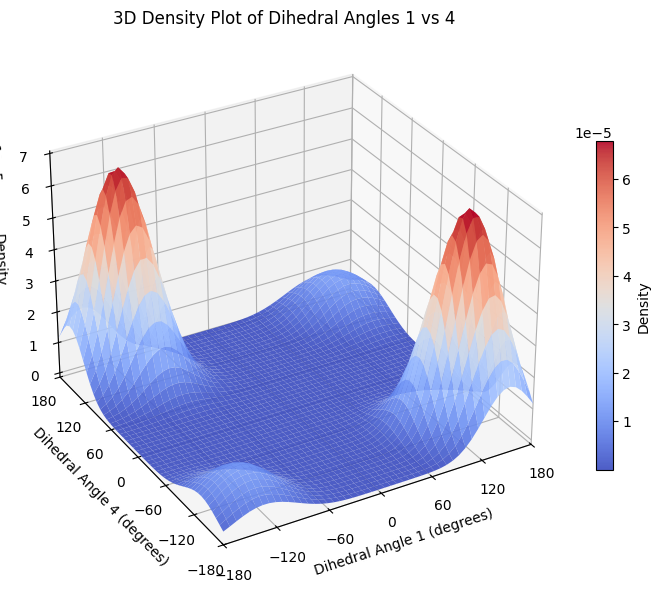

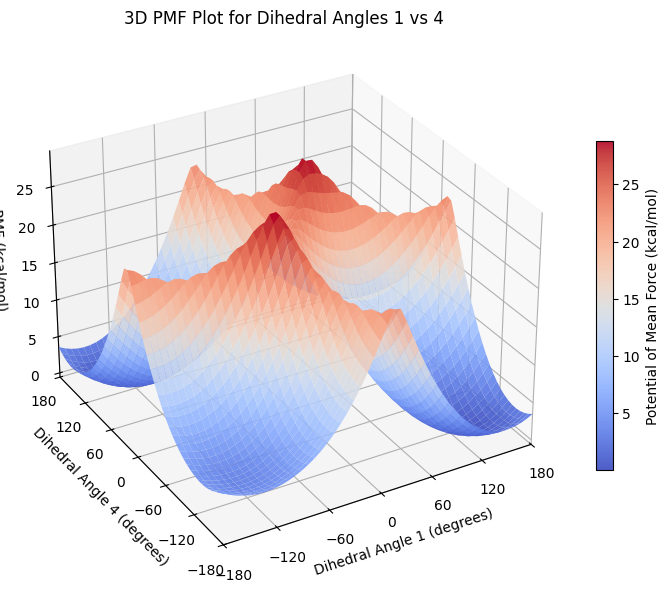

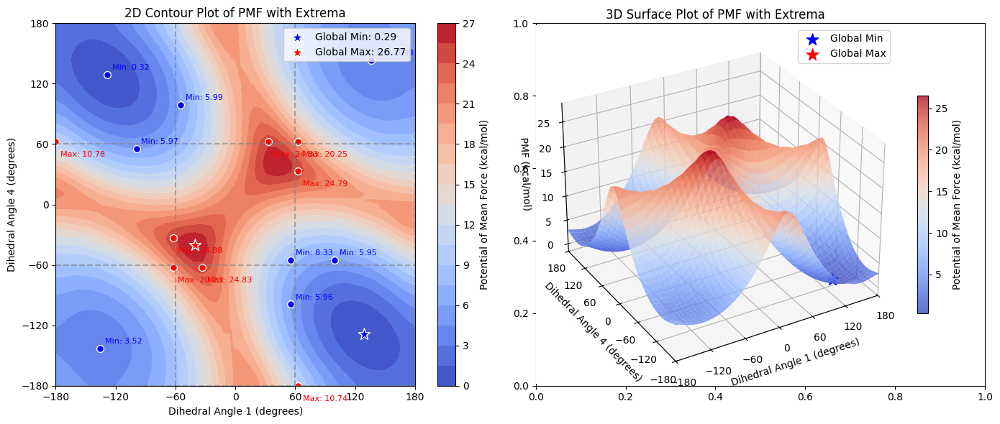


Global Extrema for Dihedral Angles 1 vs 4
Global Minimum: 0.29 kcal/mol at (128.6, -128.6) degrees
Global Maximum: 26.77 kcal/mol at (-40.4, -40.4) degrees
Energy Range: 26.49 kcal/mol

Local Minima for Dihedral Angles 1 vs 4
Region         Center         Minimum Location         Energy (kcal/mol)   
----------------------------------------------------------------------------------------------------
Region(2, 0)   (  120,  -120)   ( 128.6, -128.6)         0.29
Region(0, 2)   ( -120,   120)   (-128.6,  128.6)         0.32
Region(2, 2)   (  120,   120)   ( 135.9,  143.3)         3.38
Region(0, 0)   ( -120,  -120)   (-135.9, -143.3)         3.52
Region(2, 1)   (  120,     0)   (  99.2,  -55.1)         5.95
Region(1, 0)   (    0,  -120)   (  55.1,  -99.2)         5.96
Region(0, 1)   ( -120,     0)   ( -99.2,   55.1)         5.97
Region(1, 2)   (    0,   120)   ( -55.1,   99.2)         5.99
Region(1, 1)   (    0,     0)   (  55.1,  -55.1)         8.33

Local Maxima for Dihedral Angles 1 vs

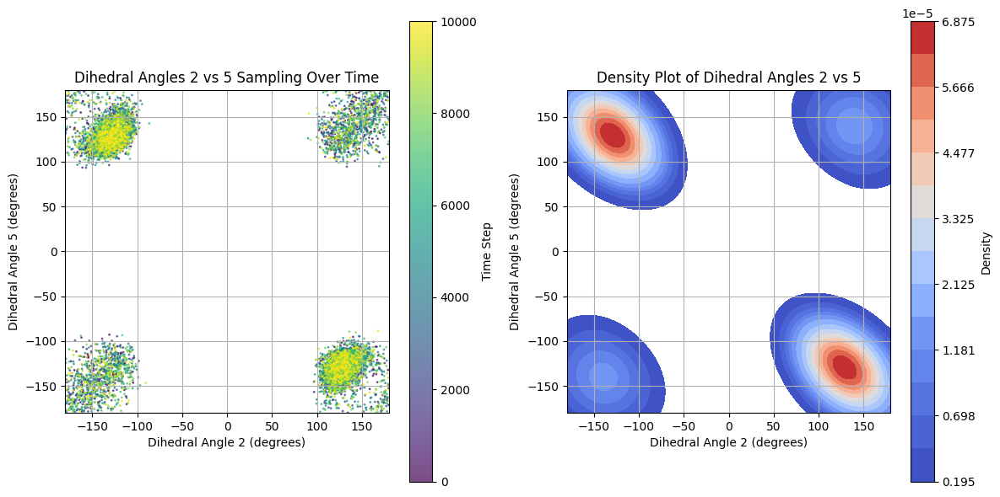

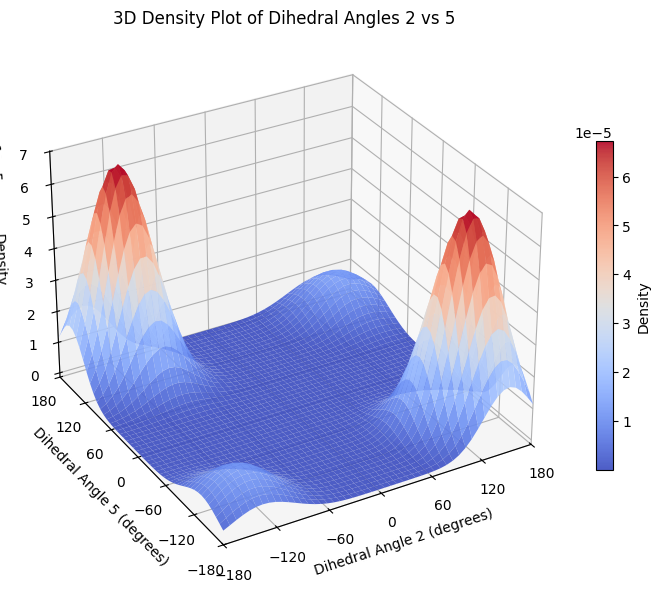

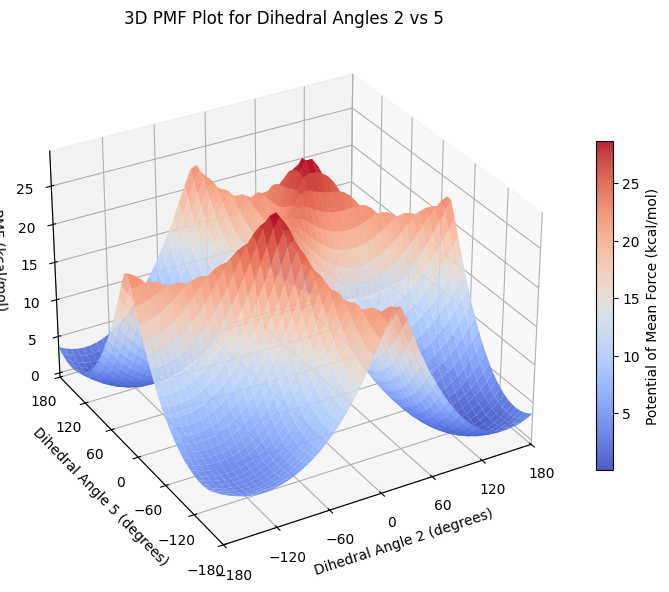

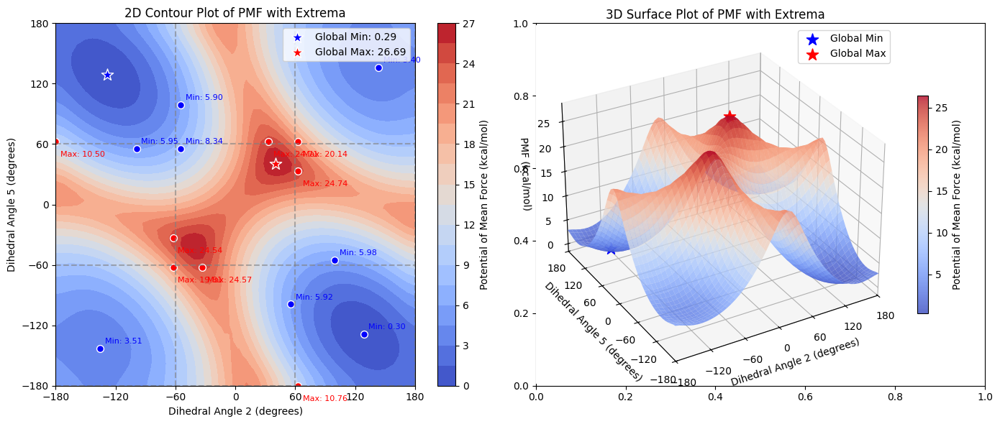


Global Extrema for Dihedral Angles 2 vs 5
Global Minimum: 0.29 kcal/mol at (-128.6, 128.6) degrees
Global Maximum: 26.69 kcal/mol at (40.4, 40.4) degrees
Energy Range: 26.40 kcal/mol

Local Minima for Dihedral Angles 2 vs 5
Region         Center         Minimum Location         Energy (kcal/mol)   
----------------------------------------------------------------------------------------------------
Region(0, 2)   ( -120,   120)   (-128.6,  128.6)         0.29
Region(2, 0)   (  120,  -120)   ( 128.6, -128.6)         0.30
Region(2, 2)   (  120,   120)   ( 143.3,  135.9)         3.40
Region(0, 0)   ( -120,  -120)   (-135.9, -143.3)         3.51
Region(1, 2)   (    0,   120)   ( -55.1,   99.2)         5.90
Region(1, 0)   (    0,  -120)   (  55.1,  -99.2)         5.92
Region(0, 1)   ( -120,     0)   ( -99.2,   55.1)         5.95
Region(2, 1)   (  120,     0)   (  99.2,  -55.1)         5.98
Region(1, 1)   (    0,     0)   ( -55.1,   55.1)         8.34

Local Maxima for Dihedral Angles 2 vs 5

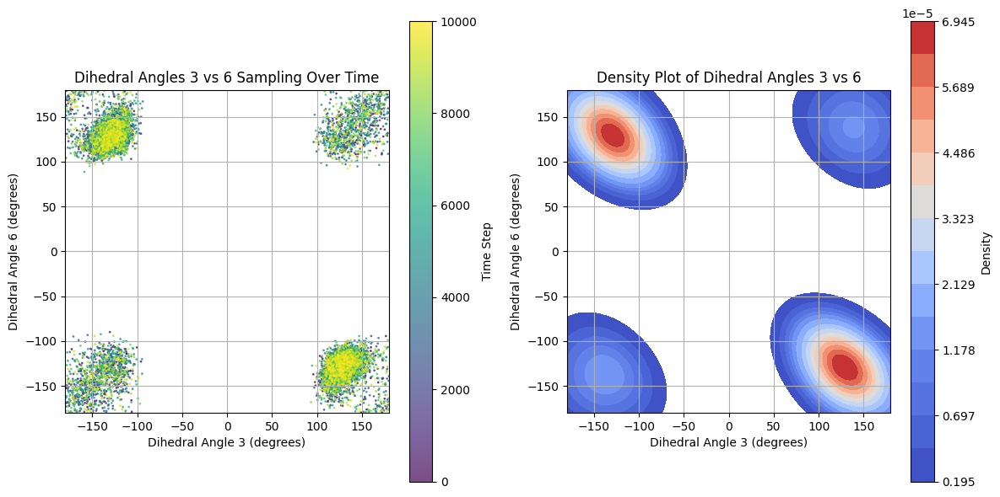

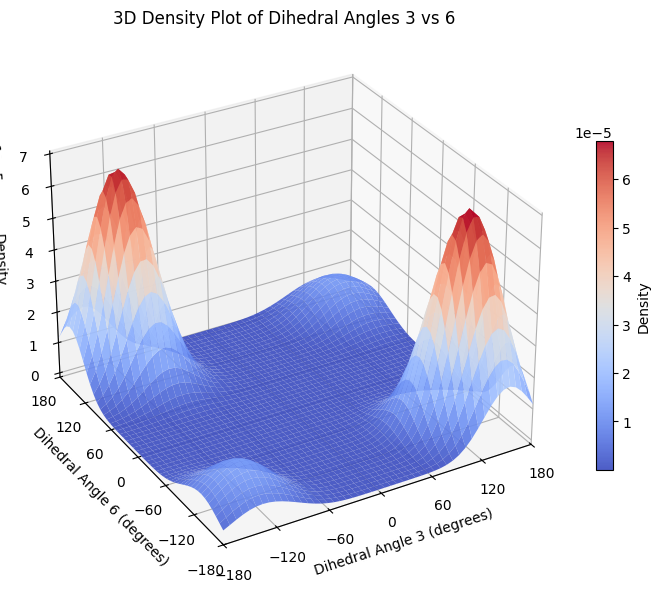

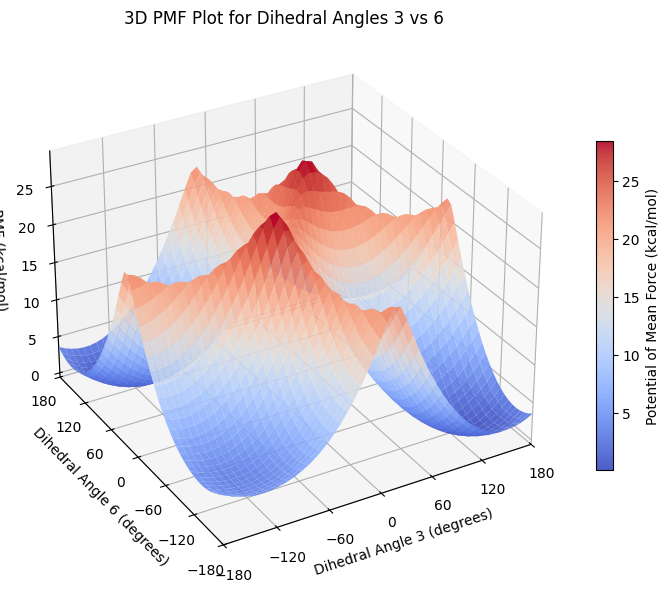

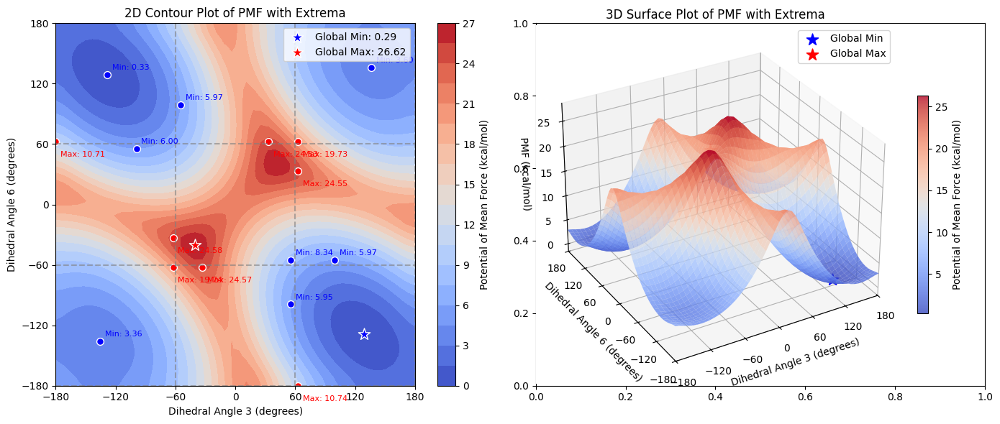


Global Extrema for Dihedral Angles 3 vs 6
Global Minimum: 0.29 kcal/mol at (128.6, -128.6) degrees
Global Maximum: 26.62 kcal/mol at (-40.4, -40.4) degrees
Energy Range: 26.33 kcal/mol

Local Minima for Dihedral Angles 3 vs 6
Region         Center         Minimum Location         Energy (kcal/mol)   
----------------------------------------------------------------------------------------------------
Region(2, 0)   (  120,  -120)   ( 128.6, -128.6)         0.29
Region(0, 2)   ( -120,   120)   (-128.6,  128.6)         0.33
Region(0, 0)   ( -120,  -120)   (-135.9, -135.9)         3.36
Region(2, 2)   (  120,   120)   ( 135.9,  135.9)         3.60
Region(1, 0)   (    0,  -120)   (  55.1,  -99.2)         5.95
Region(2, 1)   (  120,     0)   (  99.2,  -55.1)         5.97
Region(1, 2)   (    0,   120)   ( -55.1,   99.2)         5.97
Region(0, 1)   ( -120,     0)   ( -99.2,   55.1)         6.00
Region(1, 1)   (    0,     0)   (  55.1,  -55.1)         8.34

Local Maxima for Dihedral Angles 3 vs

In [8]:
def plot_pairwise_dihedrals(dihedral_angles, i, j):
    """
    Plot the joint distribution of two dihedral angles.
    
    Args:
        dihedral_angles: numpy array with all dihedral angles
        i, j: indices of the two dihedrals to analyze
    """
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    # Left: Scatter plot with viridis colormap
    scatter = axes[0].scatter(dihedral_angles[:, i], dihedral_angles[:, j], 
                             c=np.arange(dihedral_angles.shape[0]), cmap='viridis', 
                             alpha=0.7, s=1)
    cb = plt.colorbar(scatter, ax=axes[0])
    cb.set_label('Time Step')
    axes[0].set_xlabel(f'Dihedral Angle {i+1} (degrees)')
    axes[0].set_ylabel(f'Dihedral Angle {j+1} (degrees)')
    axes[0].set_xlim(-180, 180)
    axes[0].set_ylim(-180, 180)
    axes[0].set_title(f'Dihedral Angles {i+1} vs {j+1} Sampling Over Time')
    axes[0].set_aspect('equal', adjustable='box')
    axes[0].grid(True)

    # Right: Density plot with coolwarm colormap
    kde = sns.kdeplot(x=dihedral_angles[:, i], y=dihedral_angles[:, j], 
                     fill=True, cmap='coolwarm', levels=15, ax=axes[1])
    contour_filled = kde.collections[0]
    cb_right = fig.colorbar(contour_filled, ax=axes[1])
    cb_right.set_label('Density')
    axes[1].set_xlabel(f'Dihedral Angle {i+1} (degrees)')
    axes[1].set_ylabel(f'Dihedral Angle {j+1} (degrees)')
    axes[1].set_xlim(-180, 180)
    axes[1].set_ylim(-180, 180)
    axes[1].set_title(f'Density Plot of Dihedral Angles {i+1} vs {j+1}')
    axes[1].set_aspect('equal', adjustable='box')
    axes[1].grid(True)
    
    plt.tight_layout()
    plt.savefig(f"dihedral_{i+1}_vs_{j+1}.png")
    #plt.show()
    
    # 3D visualization of the joint distribution
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')

    # Compute the KDE
    kde = gaussian_kde(np.vstack([dihedral_angles[:, i], dihedral_angles[:, j]]))

    # Create a mesh grid for 3D plotting
    x_grid = np.linspace(-180, 180, 50)
    y_grid = np.linspace(-180, 180, 50)
    X, Y = np.meshgrid(x_grid, y_grid)
    positions = np.vstack([X.ravel(), Y.ravel()])
    Z = kde(positions).reshape(X.shape)  # Compute KDE values and reshape

    # 3D surface plot
    surf = ax.plot_surface(X, Y, Z, cmap='coolwarm', edgecolor='none', alpha=0.9)

    # Add a colorbar for the KDE density
    cb = fig.colorbar(surf, ax=ax, shrink=0.6)
    cb.set_label('Density')

    # Set axis labels
    ax.set_xlabel(f'Dihedral Angle {i+1} (degrees)')
    ax.set_ylabel(f'Dihedral Angle {j+1} (degrees)')
    ax.set_zlabel('Density')
    ax.set_title(f'3D Density Plot of Dihedral Angles {i+1} vs {j+1}')

    # Set plot limits
    ax.set_xticks(np.arange(-180, 181, 60))
    ax.set_yticks(np.arange(-180, 181, 60))
    ax.set_xlim(-180, 180)
    ax.set_ylim(-180, 180)

    # Adjust viewing angle
    ax.view_init(elev=30, azim=240)

    plt.tight_layout()
    plt.savefig(f"3d_density_{i+1}_vs_{j+1}.png")
    plt.show()
    
    # Calculate PMF for the joint distribution
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')

    # Compute the PMF
    pmf = -R * T * np.log(Z)
    pmf -= np.min(pmf)  # Shift minimum to zero

    # 3D surface plot of PMF
    surf = ax.plot_surface(X, Y, pmf, cmap='coolwarm', edgecolor='none', alpha=0.9)

    # Add a colorbar for the PMF
    cb = fig.colorbar(surf, ax=ax, shrink=0.6)
    cb.set_label('Potential of Mean Force (kcal/mol)')

    # Set axis labels
    ax.set_xlabel(f'Dihedral Angle {i+1} (degrees)')
    ax.set_ylabel(f'Dihedral Angle {j+1} (degrees)')
    ax.set_zlabel('PMF (kcal/mol)')
    ax.set_title(f'3D PMF Plot for Dihedral Angles {i+1} vs {j+1}')

    # Set plot limits
    ax.set_xticks(np.arange(-180, 181, 60))
    ax.set_yticks(np.arange(-180, 181, 60))
    ax.set_xlim(-180, 180)
    ax.set_ylim(-180, 180)

    # Adjust viewing angle
    ax.view_init(elev=30, azim=240)

    plt.tight_layout()
    plt.savefig(f"3d_pmf_{i+1}_vs_{j+1}.png")
    plt.show()
    
    # Analyze PMF contour with minima and maxima
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Apply Gaussian Smoothing to Reduce Noisy Minima/Maxima
    pmf_smooth = gaussian_filter(pmf, sigma=1.5)

    # Contour Plot with Minima and Maxima
    contour = axes[0].contourf(X, Y, pmf_smooth, levels=20, cmap='coolwarm')
    cb1 = fig.colorbar(contour, ax=axes[0])
    cb1.set_label('Potential of Mean Force (kcal/mol)')

    # Define tick positions and grid lines
    tick_positions = np.linspace(-180, 180, 7)
    grid_positions = tick_positions[::2]

    axes[0].set_xticks(tick_positions)
    axes[0].set_yticks(tick_positions)
    
    # Add dashed grid
    for grid_pos in grid_positions:
        axes[0].axhline(grid_pos, color='gray', linestyle="--", alpha=0.6)
        axes[0].axvline(grid_pos, color='gray', linestyle="--", alpha=0.6)

    # Define the 3×3 basin regions
    x_bins = np.linspace(-180, 180, 4)
    y_bins = np.linspace(-180, 180, 4)
    
    # Find global minimum and maximum
    global_min_idx = np.argmin(pmf_smooth)
    global_min_x = X.flatten()[global_min_idx]
    global_min_y = Y.flatten()[global_min_idx]
    global_min_value = pmf_smooth.flatten()[global_min_idx]
    
    global_max_idx = np.argmax(pmf_smooth)
    global_max_x = X.flatten()[global_max_idx]
    global_max_y = Y.flatten()[global_max_idx]
    global_max_value = pmf_smooth.flatten()[global_max_idx]
    
    # Mark global minimum with a star
    axes[0].scatter(global_min_x, global_min_y, color='blue', marker='*', s=150, edgecolor='white', zorder=5, 
                   label=f'Global Min: {global_min_value:.2f}')
    
    # Mark global maximum with a star
    axes[0].scatter(global_max_x, global_max_y, color='red', marker='*', s=150, edgecolor='white', zorder=5,
                   label=f'Global Max: {global_max_value:.2f}')

    # Find local minima and maxima in each of the 9 regions
    region_min_data = []  # To store data for the table
    region_max_data = []  # To store data for the table
    
    for k in range(3):
        for l in range(3):
            # Define the sub-region
            x_min, x_max = x_bins[k], x_bins[k+1]
            y_min, y_max = y_bins[l], y_bins[l+1]

            # Extract indices within this region
            region_mask = (X >= x_min) & (X < x_max) & (Y >= y_min) & (Y < y_max)
            
            # Find the minimum value in this region
            if np.any(region_mask):
                # Find minimum
                min_idx = np.argmin(pmf_smooth[region_mask])
                region_min_x = X[region_mask].flatten()[min_idx]
                region_min_y = Y[region_mask].flatten()[min_idx]
                region_min_value = pmf_smooth[region_mask].flatten()[min_idx]
                
                # Find maximum
                max_idx = np.argmax(pmf_smooth[region_mask])
                region_max_x = X[region_mask].flatten()[max_idx]
                region_max_y = Y[region_mask].flatten()[max_idx]
                region_max_value = pmf_smooth[region_mask].flatten()[max_idx]

                # Store data for the table
                region_center_x = (x_min + x_max) / 2
                region_center_y = (y_min + y_max) / 2
                region_min_data.append((k, l, region_center_x, region_center_y, region_min_x, region_min_y, region_min_value))
                region_max_data.append((k, l, region_center_x, region_center_y, region_max_x, region_max_y, region_max_value))

                # Plot and annotate the minimum in this basin
                if not (np.isclose(region_min_x, global_min_x) and np.isclose(region_min_y, global_min_y)):
                    axes[0].scatter(region_min_x, region_min_y, color='blue', marker='o', s=50, edgecolor='white')
                    axes[0].annotate(f"Min: {region_min_value:.2f}", (region_min_x, region_min_y), textcoords="offset points", 
                                    xytext=(5, 5), ha='left', fontsize=8, color='blue')
                
                # Plot and annotate the maximum in this basin
                if not (np.isclose(region_max_x, global_max_x) and np.isclose(region_max_y, global_max_y)):
                    axes[0].scatter(region_max_x, region_max_y, color='red', marker='o', s=50, edgecolor='white')
                    axes[0].annotate(f"Max: {region_max_value:.2f}", (region_max_x, region_max_y), textcoords="offset points", 
                                    xytext=(5, -15), ha='left', fontsize=8, color='red')

    axes[0].set_xlabel(f'Dihedral Angle {i+1} (degrees)')
    axes[0].set_ylabel(f'Dihedral Angle {j+1} (degrees)')
    axes[0].set_title('2D Contour Plot of PMF with Extrema')
    axes[0].legend(loc='upper right')
    
    # 3D Surface Plot in the second subplot with minima and maxima
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    surf = ax2.plot_surface(X, Y, pmf_smooth, cmap='coolwarm', edgecolor='none', alpha=0.8)

    # Add colorbar
    cb2 = fig.colorbar(surf, ax=ax2, shrink=0.6)
    cb2.set_label('Potential of Mean Force (kcal/mol)')

    # Mark global minimum and maximum on 3D plot
    ax2.scatter([global_min_x], [global_min_y], [global_min_value], color='blue', marker='*', s=150, label='Global Min')
    ax2.scatter([global_max_x], [global_max_y], [global_max_value], color='red', marker='*', s=150, label='Global Max')

    # Set axis labels
    ax2.set_xlabel(f'Dihedral Angle {i+1} (degrees)')
    ax2.set_ylabel(f'Dihedral Angle {j+1} (degrees)')
    ax2.set_zlabel('PMF (kcal/mol)')
    ax2.set_title('3D Surface Plot of PMF with Extrema')

    # Set ticks
    ax2.set_xticks(tick_positions)
    ax2.set_yticks(tick_positions)
    ax2.set_xlim(-180, 180)
    ax2.set_ylim(-180, 180)

    # Adjust viewing angle
    ax2.view_init(elev=30, azim=240)
    ax2.legend()

    plt.tight_layout()
    plt.savefig(f"pmf_contour_{i+1}_vs_{j+1}.png")
    plt.show()
    
    # Compare observed vs predicted probabilities
    # Count occurrences of samples in each region
    region_counts = np.zeros((3, 3))
    region_pmf_min = np.zeros((3, 3))
    
    # Calculate observed probabilities
    for k in range(3):
        for l in range(3):
            x_min, x_max = x_bins[k], x_bins[k+1]
            y_min, y_max = y_bins[l], y_bins[l+1]

            # Get fraction of data points in this region
            mask = (dihedral_angles[:, i] >= x_min) & (dihedral_angles[:, i] < x_max) & \
                   (dihedral_angles[:, j] >= y_min) & (dihedral_angles[:, j] < y_max)
            region_counts[k, l] = np.sum(mask) / len(dihedral_angles)

            # Find minimum PMF in this region
            region_mask = (X >= x_min) & (X < x_max) & (Y >= y_min) & (Y < y_max)
            if np.any(region_mask):
                min_idx = np.argmin(pmf_smooth[region_mask])
                region_pmf_min[k, l] = pmf_smooth[region_mask].flatten()[min_idx]

    # Compute Boltzmann Probabilities
    boltzmann_weights = np.exp(-region_pmf_min / (R * T))
    boltzmann_probs = boltzmann_weights / np.sum(boltzmann_weights)

    # Compute % Error
    error_percent = np.zeros((3, 3))
    for k in range(3):
        for l in range(3):
            if region_counts[k, l] > 0:
                error_percent[k, l] = abs((boltzmann_probs[k, l] - region_counts[k, l]) / region_counts[k, l]) * 100

    # Print Global Extrema Information
    print("\n" + "="*100)
    print(f"Global Extrema for Dihedral Angles {i+1} vs {j+1}")
    print("="*100)
    print(f"Global Minimum: {global_min_value:.2f} kcal/mol at ({global_min_x:.1f}, {global_min_y:.1f}) degrees")
    print(f"Global Maximum: {global_max_value:.2f} kcal/mol at ({global_max_x:.1f}, {global_max_y:.1f}) degrees")
    print(f"Energy Range: {global_max_value - global_min_value:.2f} kcal/mol")
    print("="*100)
    
    # Print Local Minima Information
    print("\n" + "="*100)
    print(f"Local Minima for Dihedral Angles {i+1} vs {j+1}")
    print("="*100)
    print(f"{'Region':<14} {'Center':<14} {'Minimum Location':<24} {'Energy (kcal/mol)':<20}")
    print("-" * 100)
    
    for k, l, center_x, center_y, min_x, min_y, min_value in sorted(region_min_data, key=lambda x: x[6]):
        print(f"Region({k}, {l})   "
              f"({center_x:>5.0f}, {center_y:>5.0f})   "
              f"({min_x:>6.1f}, {min_y:>6.1f})   "
              f"{min_value:>10.2f}")
    print("="*100)
    
    # Print Local Maxima Information
    print("\n" + "="*100)
    print(f"Local Maxima for Dihedral Angles {i+1} vs {j+1}")
    print("="*100)
    print(f"{'Region':<14} {'Center':<14} {'Maximum Location':<24} {'Energy (kcal/mol)':<20}")
    print("-" * 100)
    
    for k, l, center_x, center_y, max_x, max_y, max_value in sorted(region_max_data, key=lambda x: -x[6]):
        print(f"Region({k}, {l})   "
              f"({center_x:>5.0f}, {center_y:>5.0f})   "
              f"({max_x:>6.1f}, {max_y:>6.1f})   "
              f"{max_value:>10.2f}")
    print("="*100)

    # Print Probability Comparison
    region_centers = [(x_bins[k] + x_bins[k+1]) / 2 for k in range(3)]
    
    print("\n" + "="*100)
    print(f"Probability Comparison for Dihedral Angles {i+1} vs {j+1}")
    print("="*100)
    print(f"{'Region':<14} {'Observed P':<14} {'Energy min (kcal/mol)':<24} {'Boltzmann P':<16} {'% Error':<20}")
    print("-" * 100)
    for k in range(3):
        for l in range(3):
            print(f"({region_centers[k]:>4.0f}, {region_centers[l]:>4.0f})   "
                  f"{region_counts[k, l]:>7.3f} {region_pmf_min[k, l]:>20.2f} {boltzmann_probs[k, l]:>19.3f} {error_percent[k, l]:>14.1f}")
    print("="*100)

# Perform pairwise analysis for selected pairs of dihedrals
# For all 6 dihedrals, there are 15 possible pairs (6 choose 2)
# Here we'll analyze adjacent dihedrals and a few non-adjacent pairs for comparison

# Analyze adjacent dihedrals (more likely to be correlated)
for i in range(num_angles):
    j = (i + 1) % num_angles  # Next dihedral (wrapping around for the last one)
    plot_pairwise_dihedrals(dihedral_angles, i, j)

# Also analyze dihedrals across the ring (diametrically opposed)
for i in range(3):
    j = (i + 3) % num_angles  # Dihedral on the opposite side of the ring
    plot_pairwise_dihedrals(dihedral_angles, i, j)

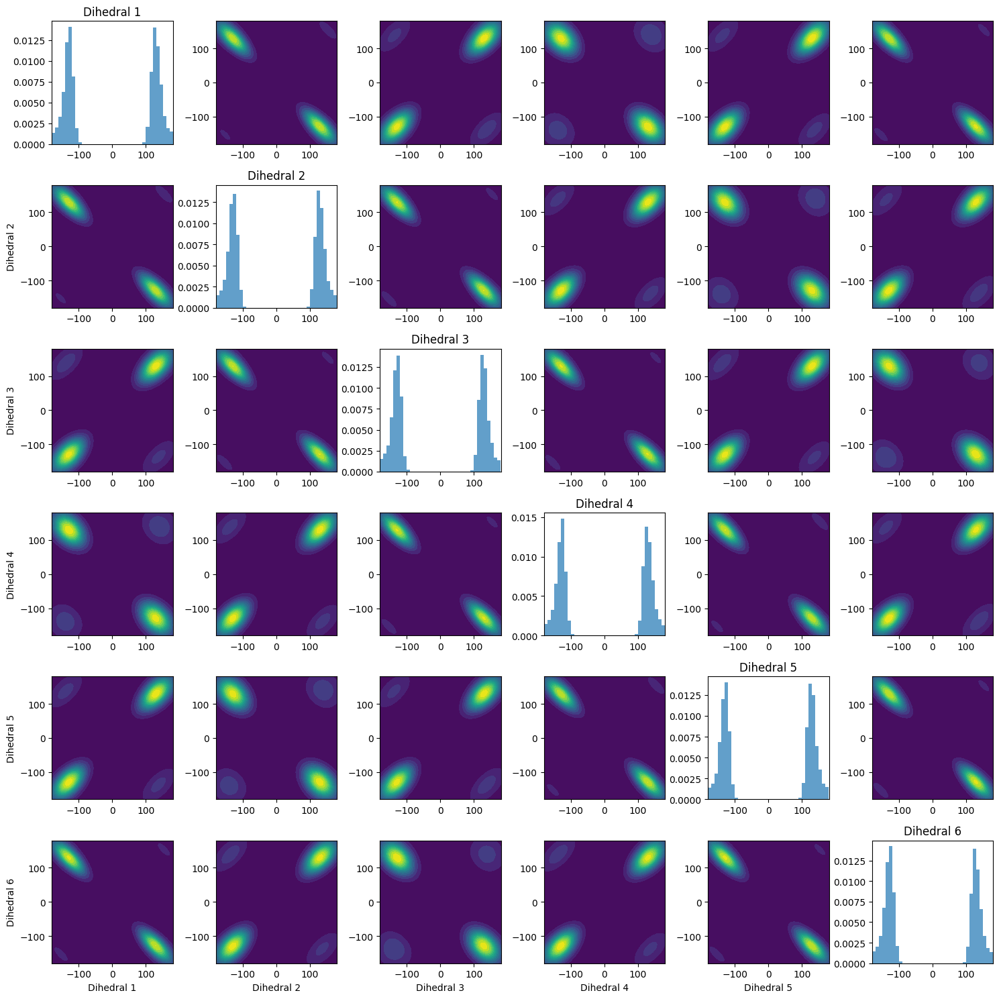

In [9]:
fig, axes = plt.subplots(num_angles, num_angles, figsize=(15, 15))

for i in range(num_angles):
    for j in range(num_angles):
        if i == j:
            # Histogram for diagonal elements
            axes[i, j].hist(dihedral_angles[:, i], bins=36, density=True, alpha=0.7)
            axes[i, j].set_title(f'Dihedral {i+1}')
            axes[i, j].set_xlim(-180, 180)
        else:
            # 2D density for off-diagonal elements
            kde = gaussian_kde(np.vstack([dihedral_angles[:, i], dihedral_angles[:, j]]))
            x_grid = np.linspace(-180, 180, 100)
            y_grid = np.linspace(-180, 180, 100)
            X, Y = np.meshgrid(x_grid, y_grid)
            positions = np.vstack([X.ravel(), Y.ravel()])
            Z = kde(positions).reshape(X.shape)
            
            # Plot as contour
            contour = axes[i, j].contourf(X, Y, Z, levels=15, cmap='viridis')
            axes[i, j].set_xlim(-180, 180)
            axes[i, j].set_ylim(-180, 180)
            
            # Only add labels on the edges
            if j == 0:
                axes[i, j].set_ylabel(f'Dihedral {i+1}')
            if i == num_angles - 1:
                axes[i, j].set_xlabel(f'Dihedral {j+1}')

plt.tight_layout()
plt.savefig("cyclohexane_dihedral_matrix.png", dpi=300)
plt.show()

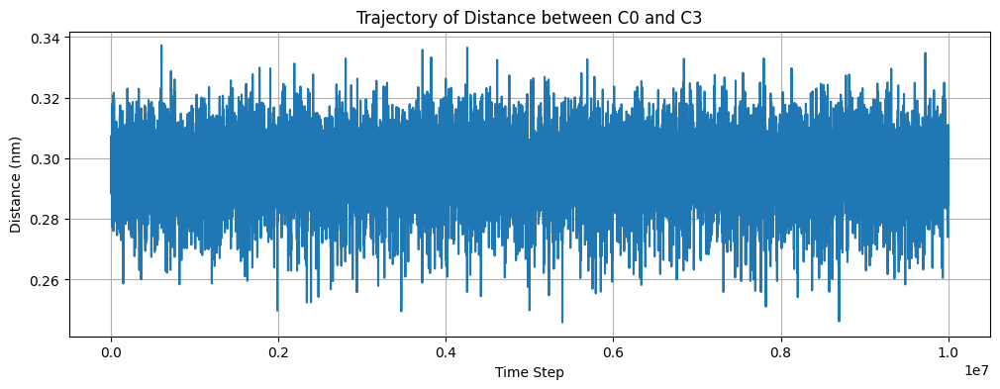

In [10]:
# Compute the distance between carbon 0 and carbon 3
distances = md.compute_distances(traj, [[carbon_atoms[0], carbon_atoms[3]]])

# Plot the distance trajectory
plt.figure(figsize=(12, 4))
plt.plot(time_steps, distances)
plt.xlabel('Time Step')
plt.ylabel('Distance (nm)')
plt.title('Trajectory of Distance between C0 and C3')
plt.grid(True)
plt.savefig("distance_trajectory.png")
plt.show()

In [11]:
# Cremer and Pople puckering coordinates
	# •	Q (puckering amplitude): Measures the total distortion from a planar ring.
	# •	θ (theta, phase angle): Describes whether the ring is in a chair, boat, or twist-boat conformation.
	# •	φ (phi, phase angle): Defines the exact positioning of atoms in the distorted ring.


def compute_cremer_pople_puckering_coordinates(phi, psi):
    """
    Compute the Cremer-Pople puckering coordinates for a cyclohexane ring.
    •	z_i are the out-of-plane displacements of the atoms.
	•	N = 6 for cyclohexane.
	•	k is the vibrational mode number.
    """
    N = 6  # Number of atoms in cyclohexane
    z = np.zeros(N)
    
    for i in range(N):
        z[i] = np.cos(np.radians(phi)) * np.cos(np.radians(i * psi))
    
    Q = np.sqrt(np.sum(z ** 2) / N)
    theta = np.degrees(np.arccos(z[0] / Q))
    phi = np.degrees(np.arctan2(z[1], z[2]))
    
    return Q, theta, phi

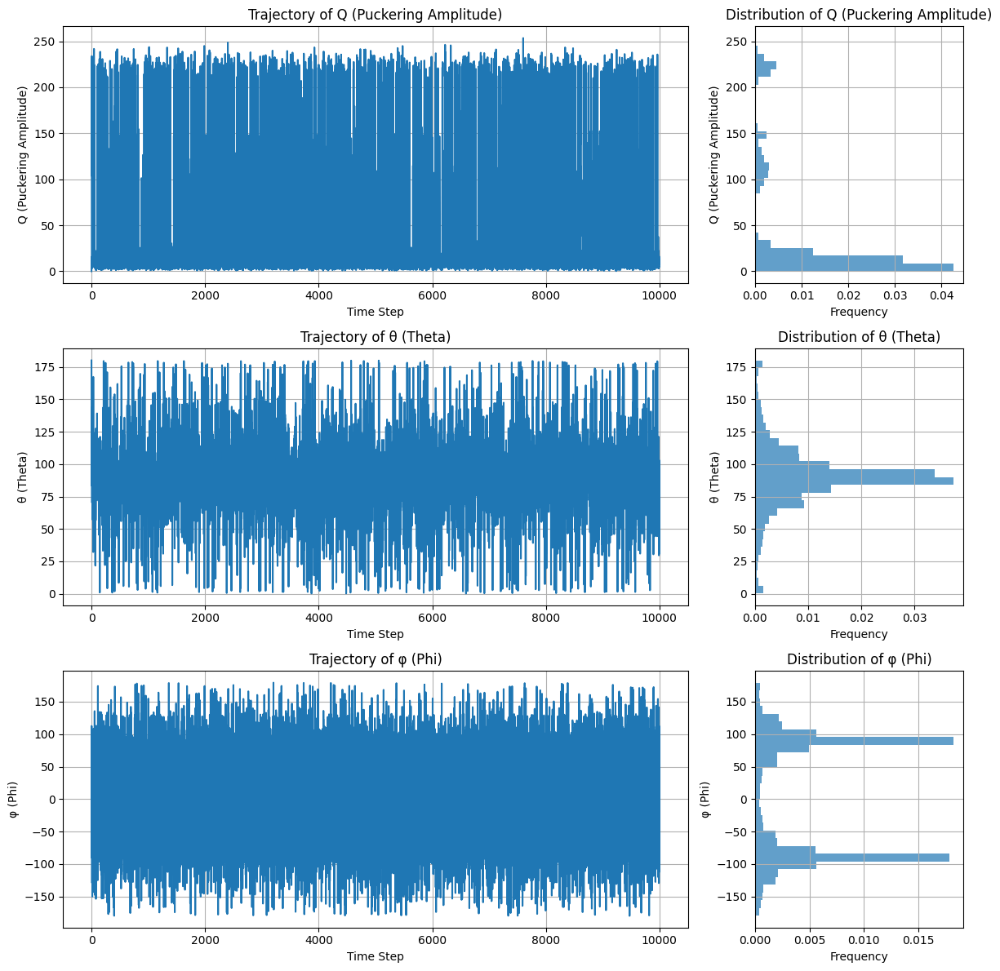

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import argrelextrema

def compute_cremer_pople(dihedrals):
    N = dihedrals.shape[0]  # Number of time steps
    indices = np.arange(6)  # Atom indices (0 to 5)

    q2 = (1 / np.sqrt(6)) * np.sum(dihedrals * np.cos(2 * np.pi * indices / 6), axis=1)
    q3 = (1 / np.sqrt(6)) * np.sum(dihedrals * np.sin(2 * np.pi * indices / 6), axis=1)
    q4 = (1 / np.sqrt(6)) * np.sum(dihedrals * np.cos(4 * np.pi * indices / 6), axis=1)

    # Puckering amplitude
    Q = np.sqrt(q2**2 + q3**2 + q4**2)

    # Puckering phase angles
    theta = np.degrees(np.arctan2(np.sqrt(q3**2 + q4**2), q2))  # Convert to degrees
    phi = np.degrees(np.arctan2(q4, q3))  # Convert to degrees

    return Q, theta, phi

# Compute Cremer-Pople coordinates from dihedral angles
Q, theta, phi = compute_cremer_pople(dihedral_angles)

# Plot Q, θ, φ trajectories
fig, axes = plt.subplots(3, 2, figsize=(12, 12), gridspec_kw={'width_ratios': [3, 1]})
time_steps = np.arange(len(Q))

for i, (data, label) in enumerate(zip([Q, theta, phi], ["Q (Puckering Amplitude)", "θ (Theta)", "φ (Phi)"])):
    # Left: Time evolution of each parameter
    axes[i, 0].plot(time_steps, data)
    axes[i, 0].set_xlabel('Time Step')
    axes[i, 0].set_ylabel(label)
    axes[i, 0].set_title(f'Trajectory of {label}')
    axes[i, 0].grid(True)

    # Right: Histogram of the parameter distribution
    axes[i, 1].hist(data, bins=30, density=True, orientation='horizontal', alpha=0.7)
    axes[i, 1].set_xlabel('Frequency')
    axes[i, 1].set_ylabel(label)
    axes[i, 1].set_title(f'Distribution of {label}')
    axes[i, 1].grid(True)

plt.tight_layout()
plt.savefig("cremer_pople_trajectories.png")
plt.show()

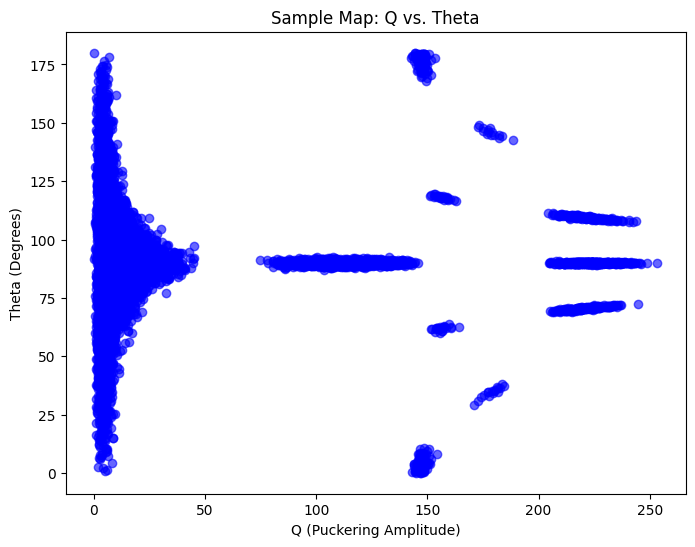

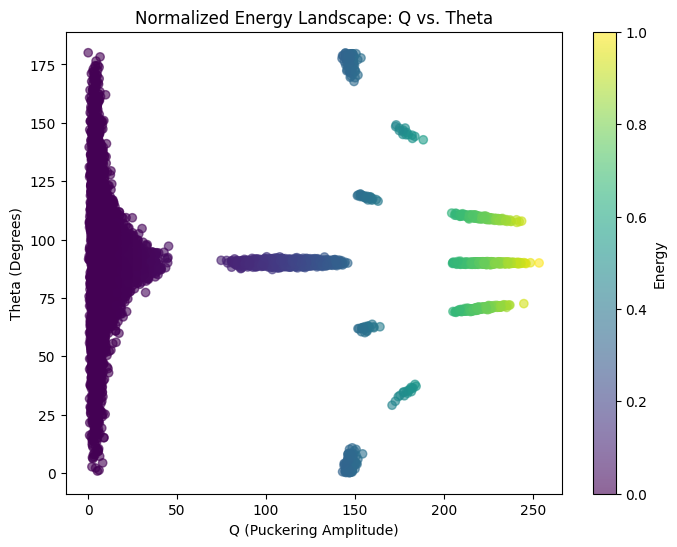

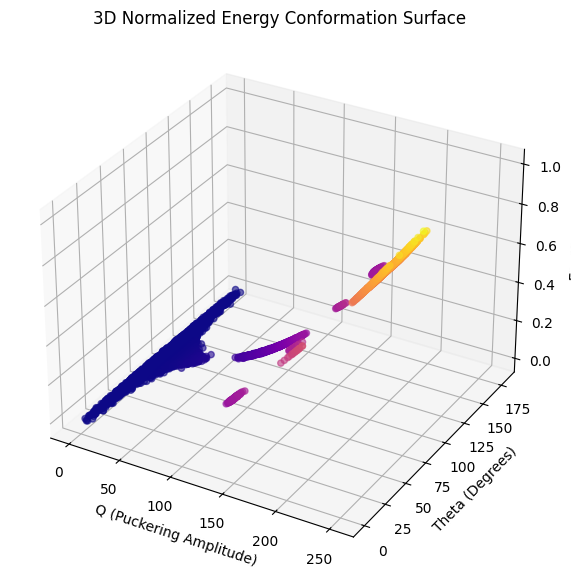

In [13]:
#Create a 2D scatter plot of Q vs. θ and Q vs. φimport numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Create the dataset using existing variables
data = {
	'Time': time_steps,
	'Q': Q,
	'Theta': theta,
	'Phi': phi
}
df = pd.DataFrame(data)

# Constants for energy function (example values, tweak as needed)
a, b, c = 1.0, 0.5, 0.3  # These values can be adjusted

# Compute energy using the model
df['Energy'] = a * df['Q']**2 + b * np.cos(3 * np.radians(df['Theta'])) + c * np.cos(6 * np.radians(df['Phi']))
df['Energy'] = np.divide(df['Energy'], np.max(df['Energy']))  # Normalize energy

# 2D Sample Map (Frequency vs Q, Theta)
plt.figure(figsize=(8, 6))
plt.scatter(df['Q'], df['Theta'], c='blue', alpha=0.6)
plt.xlabel("Q (Puckering Amplitude)")
plt.ylabel("Theta (Degrees)")
plt.title("Sample Map: Q vs. Theta")
plt.savefig("sample_map.png")
plt.show()

# 2D Energy Map (Energy vs Q, Theta)
plt.figure(figsize=(8, 6))
plt.scatter(df['Q'], df['Theta'], c=df['Energy'], cmap="viridis", alpha=0.6)
plt.colorbar(label="Energy")
plt.xlabel("Q (Puckering Amplitude)")
plt.ylabel("Theta (Degrees)")
plt.title("Normalized Energy Landscape: Q vs. Theta")
plt.savefig("energy_map.png")
plt.show()

# 3D Energy Surface Plot (Energy vs Q, Theta, Phi)
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['Q'], df['Theta'], df['Energy'], c=df['Energy'], cmap="plasma", alpha=0.6)
ax.set_xlabel("Q (Puckering Amplitude)")
ax.set_ylabel("Theta (Degrees)")
ax.set_zlabel("Energy")
ax.set_title("3D Normalized Energy Conformation Surface")
plt.savefig("energy_surface.png")
plt.show()